<style>
.rendered_html * + p, .rendered_html p {
    text-align:justify;
}
.print {
    display:none;
}
.highlight {
    background:white;
}
@media print {
 a[href]:after {
     content: ""
 }
 .noprint {
  display:none
  }
  .print {
        display:block;
    }
}
</style>
<head>
    <base target="_blank">
</head>


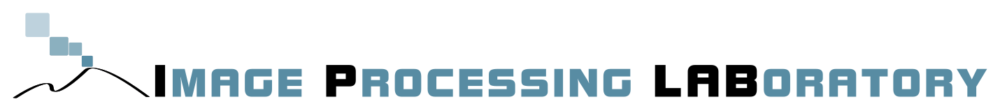

<center><h2>Deep Learning - A.A. 2021-2022</h2></center>
<center><h3>Domain Adaptation: Image to image translation, Gradient Reversal Layer, Adversarial Domain Adaptation</h3></center>
<br>
<center>Antonino Furnari - <a href="http://www.antoninofurnari.it/" target="_blank">http://www.antoninofurnari.it/</a> - <a href="mailto:furnari@dmi.unict.it">furnari@dmi.unict.it</a> </center>
<center>Giovanni Maria Farinella - <a href="http://www.dmi.unict.it/farinella/" target="_blank">http://www.dmi.unict.it/farinella/</a> - <a href="mailto:gfarinella@dmi.unict.it">gfarinella@dmi.unict.it</a> </center>

In questo laboratorio, vedremo alcuni metodi di domain adaptation basati su deep learning.

Imposiamo i seed per riproducilibilità:

In [1]:
import torch
import random
import numpy as np

np.random.seed(0)
torch.manual_seed(0)
random.seed(0)

# 1 Image to Image translation con CycleGAN - Pixel-level Domain Adaptation

Il primo metodo di domain adaptation che vediamo in questo laboratorio è pensato per lavorare su immagini ed effettua l'adattamento al livello dei pixel. L'approccio che vediamo qui assume che siano disponibili delle immagini appartenenti al dominio A e delle immagini appartenenti al dominio B, ma che tali esempi siano non accoppiati. L'approccio che vedremo si chiama CycleGAN e si basa sul principio della cycle consistency loss. Si faccia riferimento a https://arxiv.org/abs/1703.10593 per la pubblicazione ufficiale.

L'obiettivo di CycleGAN è quello di trasformare una immagine appartentente a un dominio di partenza in una immagine dal lo stesso contenuto, ma che possa essere "scambiata" per una immagine appartenente a un dominio di destinazione. Per fare ciò, l'algoritmo trasformerà l'immagine cambiandone solo lo stile. Esempi di trasformazioni tra due domini sono mostrati di seguito:

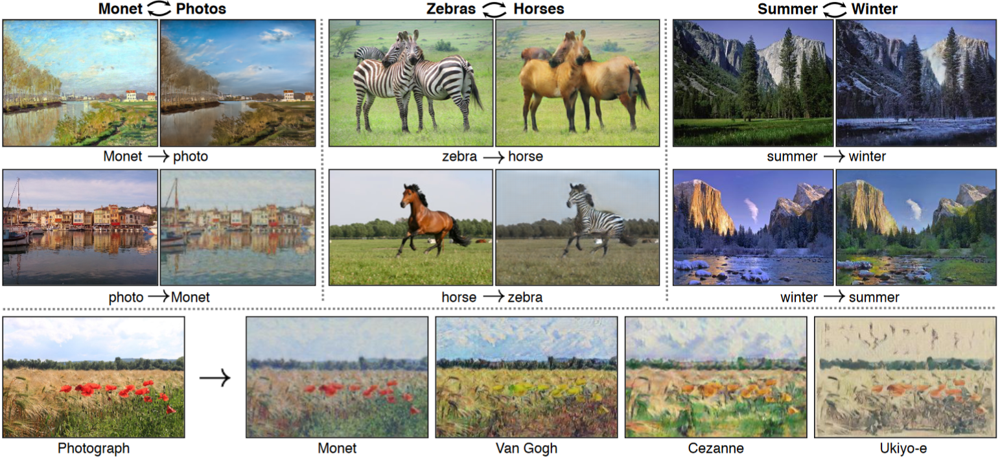

Il modello che effettuerà la trasformazione si basa su due insiemi di immagini appartenenti ai due domini A e B. Si assumerà che le immagini sono "disaccoppiate", il che vuol dire che a una data immagine di A non corrisponderà una specifica immagine di B in termini di contenuto. 

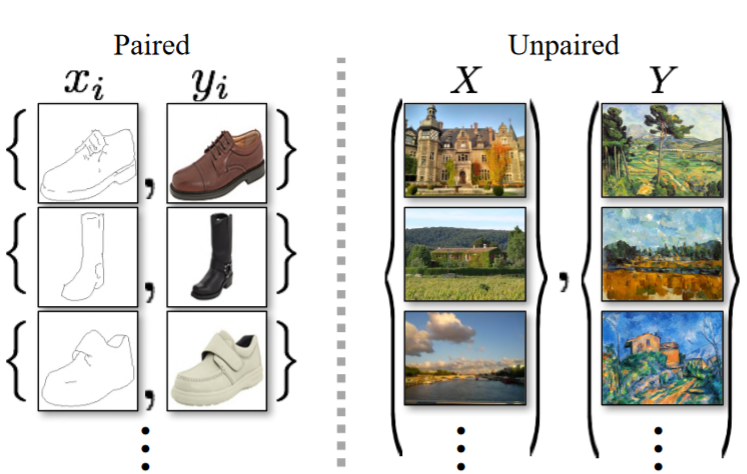

<div>
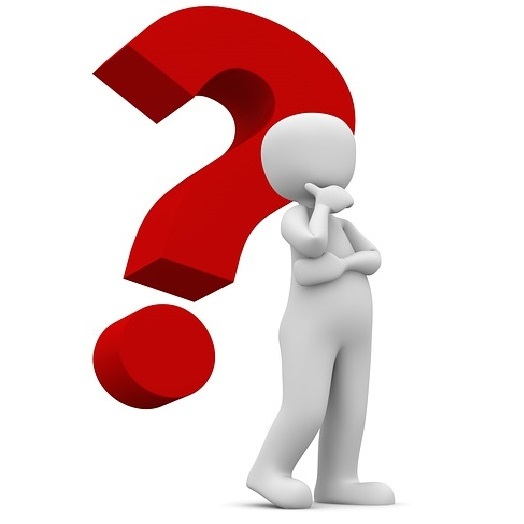
</div>

**Domanda 1**

Perché CycleGAN assume che le immagini dei due domini sono non accoppiate? Qual è il vantaggio? Quali sono le limitazioni?

<div>
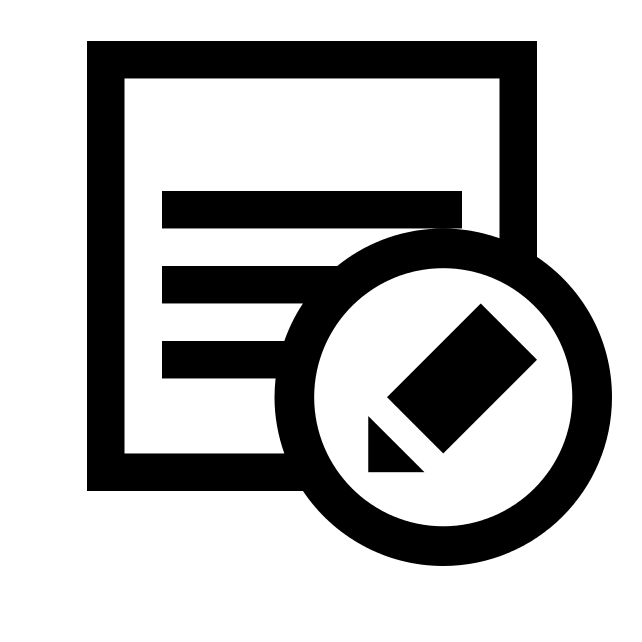
</div>

**Risposta 1**

<div style="background-color:#efefef; margin-left:150px; border:solid 1px; border-color:#dddddd; border-radius: 3px;">
<br><br><br><br><br><br>
</div>

Per effettuare il training sotto queste condizioni, vengono usati due moduli, uno che trasforma le immagini dal dominio A al dominio B e uno che trasforma le immagini dal dominio B al dominio A. Questi due moduli sono detti "generatori" in analogia con le GAN. Vengono dunque usati due discriminatori per assicurarci che le immagini generate siano indistinguibili da quelle effettivamente appartenenti ai due domini. Per gestire il caso di immagini non accoppiati, viene utilizzata la cycle consistency loss che incoraggia il modello a far si che una immagine trasformata da A a B e poi nuovamente in A sia coerente con l'immagine di partenza.

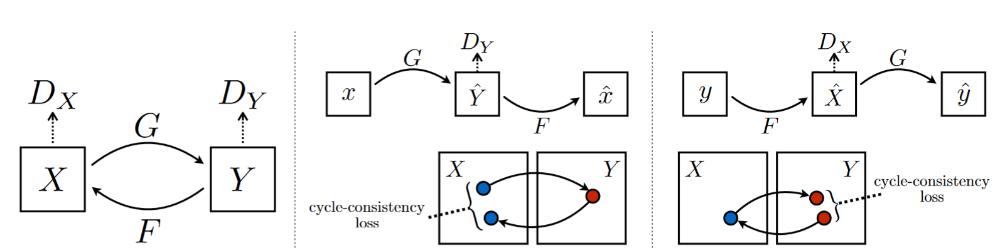

In questo laboratorio, faremo riferimento all'implementazione in PyTorch disponibile al link che segue, ma ne riproporremo una implementazione basata su PyTorch Lightning: https://github.com/aitorzip/PyTorch-CycleGAN.

## 1.1 Dati
Per i nostri esperimenti, considereremo un semplice dataset di immagini non accoppiate appartenenti a due domini: "Russian Blue Cat" e "Grumpy Cat". Scarichiamo il dataset dal sito degli autori di CycleGAN mediante il comando:

`wget https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/grumpifycat.zip`

Estraiamo adesso le immagini dall'archivio con:

`unzip grumpifycat.zip`

Dovremmo adesso trovare una cartella `grumpifycat` con le sottocartelle `trainA` e `trainB`.

Per caricare il dataset ed accedere alle immagini, definiamo una classe `ImageDataset`:

In [2]:
import glob
import random
import os
from torch.utils.data import Dataset
from PIL import Image
import torchvision.transforms as transforms


class ImageDataset(Dataset):
    def __init__(self, root, transform=None, mode='train'):
        self.transform = transform #conserva la transform

        # ottieni i path delle immagini in A e B
        self.files_A = sorted(glob.glob(os.path.join(root, '%sA' % mode) + '/*.*'))
        self.files_B = sorted(glob.glob(os.path.join(root, '%sB' % mode) + '/*.*'))

    def __getitem__(self, index):
        #apro l'iesima immagine A (uso il modulo per evitare di sforare)
        item_A = Image.open(self.files_A[index % len(self.files_A)])
        #apro una immagine B a caso
        item_B = Image.open(self.files_B[random.randint(0, len(self.files_B) - 1)])
        
        if self.transform:
            item_A = self.transform(item_A)
            item_B = self.transform(item_B)

        return item_A, item_B

    def __len__(self):
        return max(len(self.files_A), len(self.files_B))

Possiamo adesso definire l'oggetto dataset e caricare come segue:

In [3]:
dset = ImageDataset('grumpifycat')

Visualizzimo quindi una coppia di immagini:

In [4]:
from matplotlib import pyplot as plt
import numpy as np
plt.figure(figsize=(12,8))
plt.subplot(121)
plt.imshow(np.array(dset[0][0]))
plt.axis('off')
plt.subplot(122)
plt.imshow(np.array(dset[0][1]))
plt.axis('off')
plt.show()

<Figure size 1200x800 with 2 Axes>

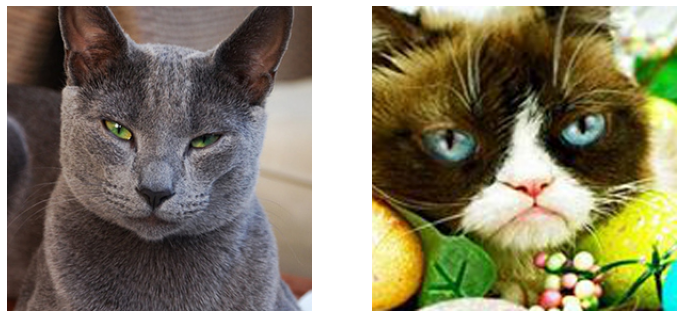

In [5]:
plt.figure(figsize=(12,8))
plt.subplot(121)
plt.imshow(np.array(dset[300][0]))
plt.axis('off')
plt.subplot(122)
plt.imshow(np.array(dset[300][1]))
plt.axis('off')
plt.show()

<div>
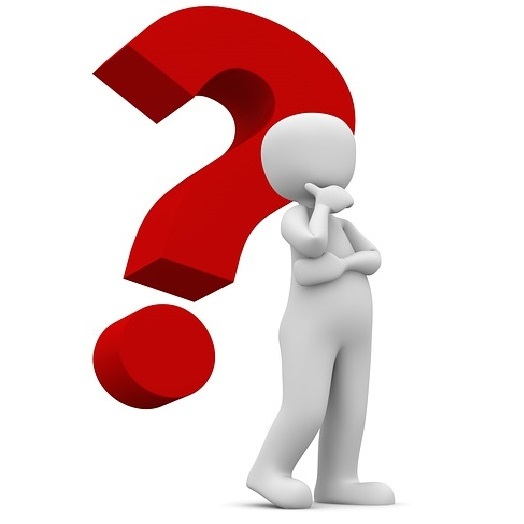
</div>

**Domanda 2**

Si confrontino le immagini ottenute. Sono accoppiate o no? Cosa succede se provo a ottenere e visualizzare due volte la stessa coppia?

<div>
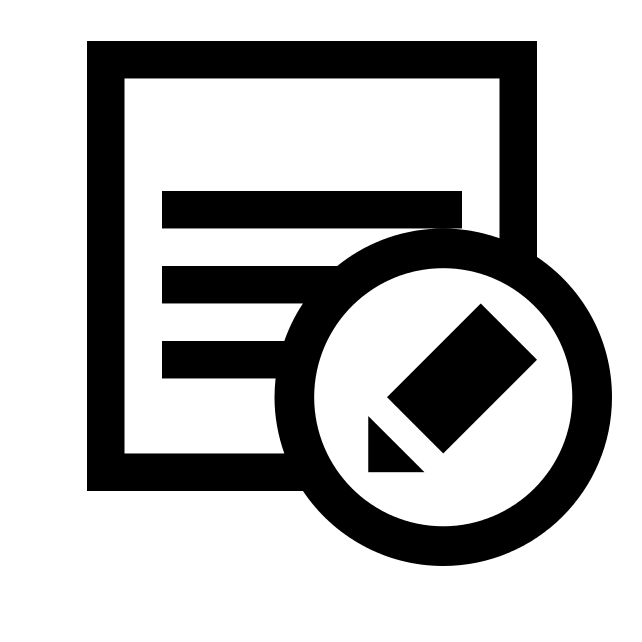
</div>

**Risposta 2**

<div style="background-color:#efefef; margin-left:150px; border:solid 1px; border-color:#dddddd; border-radius: 3px;">
<br><br><br><br><br><br>
</div>

## 1.2 Implementazione
Definiamo i modelli che utilizzeremo per costruire la rete CycleGAN, ovvero il generatore e il discriminatore. Iniziamo definendo il ResidualBlock, alla base del generatore:

In [6]:
import torch.nn as nn
import torch.nn.functional as F

class ResidualBlock(nn.Module):
    def __init__(self, in_features):
        super(ResidualBlock, self).__init__()

        # Il blocco segue la struttura di un classico residual block di ResNet
        conv_block = [  nn.ReflectionPad2d(1), # Il ReflectionPad fa padding usando una versione "specchiata" del bordo dell'immagine
                        nn.Conv2d(in_features, in_features, 3),
                        nn.InstanceNorm2d(in_features), # Instance normalization, un tipo di normalizzazione simile a batch normalization spesso usato per style transfer
                        nn.ReLU(inplace=True),
                        nn.ReflectionPad2d(1),
                        nn.Conv2d(in_features, in_features, 3),
                        nn.InstanceNorm2d(in_features)  ]

        self.conv_block = nn.Sequential(*conv_block)

    def forward(self, x):
        # La forward applica il blocco e somma l'input per ottenere una connessione residua
        return x + self.conv_block(x)

Definiamo dunque il generatore basato sui blocchi residui:

In [7]:
class Generator(nn.Module):
    def __init__(self, input_nc, output_nc, n_residual_blocks=9):
        super(Generator, self).__init__()

        # Blocco di convoluzioni iniziale che mappa l'input su 64 feature maps
        model = [   nn.ReflectionPad2d(3),
                    nn.Conv2d(input_nc, 64, 7),
                    nn.InstanceNorm2d(64),
                    nn.ReLU(inplace=True) ]

        # ============ Encoder ============
        # Due blocchi che mappano l'input
        # da 64 a 128 e da 128 a 256 mappe
        in_features = 64
        out_features = in_features*2
        for _ in range(2):
            model += [  nn.Conv2d(in_features, out_features, 3, stride=2, padding=1),
                        nn.InstanceNorm2d(out_features),
                        nn.ReLU(inplace=True) ]
            in_features = out_features
            out_features = in_features*2

        # Aggiungiamo dunque i residual blocks
        for _ in range(n_residual_blocks):
            model += [ResidualBlock(in_features)]

        # ============ Decoder =============
        # Due blocchi di convoluzione
        out_features = in_features//2
        for _ in range(2):
            # Qui usiamo la convoluzione trasposta (https://github.com/vdumoulin/conv_arithmetic/blob/master/README.md)
            # che fa upsampling piuttosto che downsampling quando si impostano stride e padding
            model += [  nn.ConvTranspose2d(in_features, out_features, 3, stride=2, padding=1, output_padding=1),
                        nn.InstanceNorm2d(out_features),
                        nn.ReLU(inplace=True) ]
            in_features = out_features
            out_features = in_features//2

        # Layer finale di output
        model += [  nn.ReflectionPad2d(3),
                    nn.Conv2d(64, output_nc, 7),
                    nn.Tanh() ]

        # Inizializziamo l'oggetto sequential con la lista dei moduli
        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)

Possiamo analizzare le dimensioni delle feature map intermedie del modello mediante la libreria `torchsummary`, che possiamo installare con il comando:

`pip install torchsummary`

Vediamo quali sono le dimensioni intermedie delle feature map con un input di dimensioni $3 \times 224 \times 224$:

In [8]:
from torchsummary import summary
gen = Generator(3,3).cuda()
summary(gen, (3,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ReflectionPad2d-1          [-1, 3, 230, 230]               0
            Conv2d-2         [-1, 64, 224, 224]           9,472
    InstanceNorm2d-3         [-1, 64, 224, 224]               0
              ReLU-4         [-1, 64, 224, 224]               0
            Conv2d-5        [-1, 128, 112, 112]          73,856
    InstanceNorm2d-6        [-1, 128, 112, 112]               0
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8          [-1, 256, 56, 56]         295,168
    InstanceNorm2d-9          [-1, 256, 56, 56]               0
             ReLU-10          [-1, 256, 56, 56]               0
  ReflectionPad2d-11          [-1, 256, 58, 58]               0
           Conv2d-12          [-1, 256, 56, 56]         590,080
   InstanceNorm2d-13          [-1, 256, 56, 56]               0
             ReLU-14          [-1, 256,

<div>
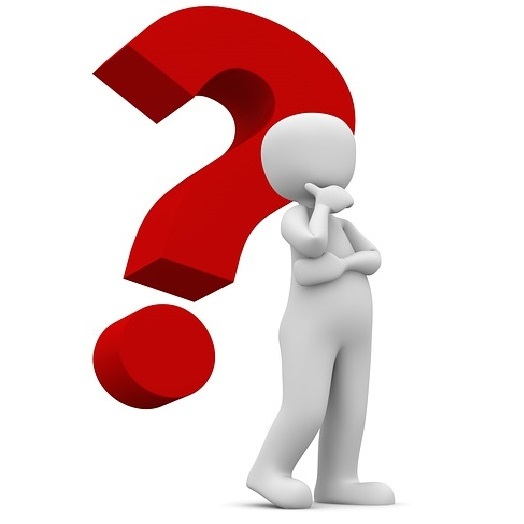
</div>

**Domanda 3**

Quale modello visto negli scorsi laboratori ricorda il generatore qui definito? Quali sono le differenze tra i due modelli?

<div>
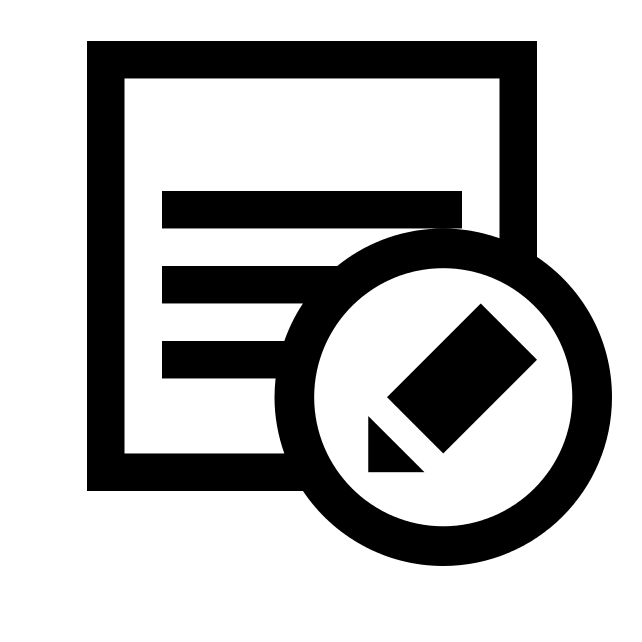
</div>

**Risposta 3**

<div style="background-color:#efefef; margin-left:150px; border:solid 1px; border-color:#dddddd; border-radius: 3px;">
<br><br><br><br><br><br>
</div>

Come possiamo vedere dal summary sopra, il modello è composto di due parti: un encoder con diversi residual block e un decoder con alcuni blocchi di convoluzioni. L'encoder effettua downsampling dell'immagine, mentre il decoder effettua un upsampling per restituire una immagine delle stesse dimensioni dell'input.

Costruiamo quindi il decoder:

In [9]:
class Discriminator(nn.Module):
    def __init__(self, input_nc):
        super(Discriminator, self).__init__()

        # Diversi layer di convoluzione. In questo caso usiamo le LeakyReLU invece delle ReLU
        model = [   nn.Conv2d(input_nc, 64, 4, stride=2, padding=1),
                    nn.LeakyReLU(0.2, inplace=True) ]

        model += [  nn.Conv2d(64, 128, 4, stride=2, padding=1),
                    nn.InstanceNorm2d(128), 
                    nn.LeakyReLU(0.2, inplace=True) ]

        model += [  nn.Conv2d(128, 256, 4, stride=2, padding=1),
                    nn.InstanceNorm2d(256), 
                    nn.LeakyReLU(0.2, inplace=True) ]

        model += [  nn.Conv2d(256, 512, 4, padding=1),
                    nn.InstanceNorm2d(512), 
                    nn.LeakyReLU(0.2, inplace=True) ]

        # Layer di classificazione
        model += [nn.Conv2d(512, 1, 4, padding=1)]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        x =  self.model(x)
        # Average pooling
        return F.avg_pool2d(x, x.size()[2:]).view(x.size()[0], -1)

Possiamo visualizzare anche in questo caso le dimensioni delle mappe intermedie con `torchsummary`:

In [10]:
from torchsummary import summary
disc = Discriminator(3).cuda()
summary(disc, (3,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           3,136
         LeakyReLU-2         [-1, 64, 112, 112]               0
            Conv2d-3          [-1, 128, 56, 56]         131,200
    InstanceNorm2d-4          [-1, 128, 56, 56]               0
         LeakyReLU-5          [-1, 128, 56, 56]               0
            Conv2d-6          [-1, 256, 28, 28]         524,544
    InstanceNorm2d-7          [-1, 256, 28, 28]               0
         LeakyReLU-8          [-1, 256, 28, 28]               0
            Conv2d-9          [-1, 512, 27, 27]       2,097,664
   InstanceNorm2d-10          [-1, 512, 27, 27]               0
        LeakyReLU-11          [-1, 512, 27, 27]               0
           Conv2d-12            [-1, 1, 26, 26]           8,193
Total params: 2,764,737
Trainable params: 2,764,737
Non-trainable params: 0
---------------------------

Il discriminatore riduce la dimensionalità dell'input aumentando il numero di mappe. Notiamo comunque che l'output è un  numero reale (il logit):

In [11]:
disc(torch.zeros(1,3,224,224).cuda()).shape

torch.Size([1, 1])

Durante il training, ci servirà uno scheduler per controllare l'andamento del learning rate. Definiamone uno ad hoc che permetta di far decadere il learning rate dopo le prime `decay_start_epoch` epoche:

In [12]:
class LambdaLR():
    def __init__(self, n_epochs, offset, decay_start_epoch):
        assert ((n_epochs - decay_start_epoch) > 0), "Decay must start before the training session ends!"
        self.n_epochs = n_epochs
        self.offset = offset
        self.decay_start_epoch = decay_start_epoch

    def step(self, epoch):
        return 1.0 - max(0, epoch + self.offset - self.decay_start_epoch)/(self.n_epochs - self.decay_start_epoch)

Definiamo adesso una funzione per inizializzare i layer dei moduli definiti:

In [13]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    # Inizializziamo le convoluzioni con rumore gaussiano
    # di media zero e deviazione standard 0.02
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    # Nel caso della batchnorm2d useremo media 1 e deviazione standard 0.02
    elif classname.find('BatchNorm2d') != -1:
        m.weight.data.normal_(1.0, 0.02)
        # il bias è costante e pari a zero
        m.bias.data.fill_(0.0)

Abbiamo definito i moduli che implementano i vari componenti di CycleGAN come moduli di PyTorch (e non Lightning). Definiremo adesso un modulo di Lightning che definisca solo come effettuare il training:

In [14]:
import pytorch_lightning as pl
import itertools
from torch.utils.data import DataLoader
import torchvision

class CycleGAN(pl.LightningModule):
    def __init__(self, 
                 input_nc = 3, # numero di canali in input
                 output_nc = 3, # numero di canali in output
                 image_size = 256, # la dimensione dell'immagine
                 lr=0.0002, # learning rate
                 betas=(0.5, 0.999), # valori beta di Adam
                 starting_epoch=0, # epoca di partenza (0 se non stiamo facendo resume di un training interrotto)
                 n_epochs=200, # numero totale di epoche
                 decay_epoch=100, # epoca dopo la quale iniziare a far scendere il learning rate
                 data_root = 'grumpifycat', #cartella in cui si trovano i dati
                 batch_size = 1, #batch size
                 n_cpu = 8 # numeri di thread per il dataloader
                  ):
        super(CycleGAN, self).__init__()
        self.save_hyperparameters()
        
        # Definiamo due generatori: da A a B e da B ad A
        self.netG_A2B = Generator(input_nc, output_nc)
        self.netG_B2A = Generator(output_nc, input_nc)
        
        # Definiamo due discriminatori: uno per A e uno per B
        self.netD_A = Discriminator(input_nc)
        self.netD_B = Discriminator(output_nc)
        
        # Applichiamo la normalizzazione
        self.netG_A2B.apply(weights_init_normal)
        self.netG_B2A.apply(weights_init_normal)
        self.netD_A.apply(weights_init_normal)
        self.netD_B.apply(weights_init_normal)
        
        # Definiamo le loss
        self.criterion_GAN = torch.nn.MSELoss()
        self.criterion_cycle = torch.nn.L1Loss()
        self.criterion_identity = torch.nn.L1Loss()
                    
    def forward(self, x, mode='A2B'):
        if mode=='A2B':
            return netG_A2B(x)
        else:
            return netG_B2A(x)
    
    # ci servono 3 optimizer, ognuno con il suo scheduler
    def configure_optimizers(self):
        # Optimizer per il generatore
        optimizer_G = torch.optim.Adam(itertools.chain(self.netG_A2B.parameters(), self.netG_B2A.parameters()),
                                lr=self.hparams.lr, betas=self.hparams.betas)
        
        # Optimizers per i due discriminatori
        optimizer_D_A = torch.optim.Adam(self.netD_A.parameters(), lr=self.hparams.lr, betas=self.hparams.betas)
        optimizer_D_B = torch.optim.Adam(self.netD_B.parameters(), lr=self.hparams.lr, betas=self.hparams.betas)
        
        # Questi scheduler fanno decadere il learning rate dopo 100 epoche
        lr_scheduler_G = torch.optim.lr_scheduler.LambdaLR(optimizer_G, lr_lambda=LambdaLR(self.hparams.n_epochs, self.hparams.starting_epoch, self.hparams.decay_epoch).step)
        lr_scheduler_D_A = torch.optim.lr_scheduler.LambdaLR(optimizer_D_A, lr_lambda=LambdaLR(self.hparams.n_epochs, self.hparams.starting_epoch, self.hparams.decay_epoch).step)
        lr_scheduler_D_B = torch.optim.lr_scheduler.LambdaLR(optimizer_D_B, lr_lambda=LambdaLR(self.hparams.n_epochs, self.hparams.starting_epoch, self.hparams.decay_epoch).step)
        
        # Restituiamo i tre optimizer e i tre optimizers
        return [optimizer_G, optimizer_D_A, optimizer_D_B], [lr_scheduler_G, lr_scheduler_D_A, lr_scheduler_D_B]
    
    
    def training_step(self, batch, batch_idx, optimizer_idx):
        real_A, real_B = batch
        
        target_real = torch.ones((real_A.shape[0],1)).type_as(real_A)
        target_fake = torch.zeros((real_A.shape[0],1)).type_as(real_A)
        
        # optimizer del generatore
        if optimizer_idx==0:
            # Identity loss
            # G_A2B(B) should equal B if real B is fed
            same_B = self.netG_A2B(real_B) # passa B al generatore A2B - deve essere uguale a B
            loss_identity_B = self.criterion_identity(same_B, real_B)*5.0

            # G_B2A(A) should equal A if real A is fed
            same_A = self.netG_B2A(real_A) # passa A al generatore B2A - deve essere uguale ad A
            loss_identity_A = self.criterion_identity(same_A, real_A)*5.0

            # GAN loss
            fake_B = self.netG_A2B(real_A) # passa A ad A2B - sono le fake B
            pred_fake = self.netD_B(fake_B) # predizioni del discriminatore B
            loss_GAN_A2B = self.criterion_GAN(pred_fake, target_real) # loss GAN per A2B

            fake_A = self.netG_B2A(real_B) # passa B a B2A - sono le fake A
            pred_fake = self.netD_A(fake_A) # predizioni del discriminatore A
            loss_GAN_B2A = self.criterion_GAN(pred_fake, target_real) # loss GAN per B2A

            # Cycle consistency loss
            recovered_A = self.netG_B2A(fake_B) #passiamo le fake B a B2A - devono essere uguali a real_A
            loss_cycle_ABA = self.criterion_cycle(recovered_A, real_A)*10.0 #cycle consistency loss

            recovered_B = self.netG_A2B(fake_A) #passiamo le fake A a A2B - devono essere uguali a real_B
            loss_cycle_BAB = self.criterion_cycle(recovered_B, real_B)*10.0 #cycle consistency loss

            # loss globale
            loss_G = loss_identity_A + loss_identity_B + loss_GAN_A2B + loss_GAN_B2A + loss_cycle_ABA + loss_cycle_BAB
            self.log('loss_G/loss_identity_A', loss_identity_A)
            self.log('loss_G/loss_identity_B', loss_identity_B)
            self.log('loss_G/loss_GAN_A2B', loss_GAN_A2B)
            self.log('loss_G/loss_GAN_B2A', loss_GAN_B2A)
            self.log('loss_G/loss_cycle_ABA', loss_cycle_ABA)
            self.log('loss_G/loss_cycle_BAB', loss_cycle_BAB)
            self.log('loss_G/overall', loss_G)
            
            # loggiamo dei campioni visivi da ispezionare durante il training ogni 100 batch
            if batch_idx % 100 ==0:
                grid_A = torchvision.utils.make_grid(real_A[:50], nrow=10, normalize=True)
                grid_A2B = torchvision.utils.make_grid(fake_B[:50], nrow=10, normalize=True)
                grid_A2B2A = torchvision.utils.make_grid(recovered_A[:50], nrow=10, normalize=True)
                
                grid_B = torchvision.utils.make_grid(real_B[:50], nrow=10, normalize=True)
                grid_B2A = torchvision.utils.make_grid(fake_A[:50], nrow=10, normalize=True)
                grid_B2A2B = torchvision.utils.make_grid(recovered_B[:50], nrow=10, normalize=True)
                
                self.logger.experiment.add_image('A/A', grid_A, self.global_step)
                self.logger.experiment.add_image('A/A2B', grid_A2B, self.global_step)
                self.logger.experiment.add_image('A/A2B2A', grid_A2B2A, self.global_step)
                
                self.logger.experiment.add_image('B/B', grid_B, self.global_step)
                self.logger.experiment.add_image('B/B2A', grid_B2A, self.global_step)
                self.logger.experiment.add_image('B/B2A2B', grid_B2A2B, self.global_step)
                
            return loss_G
        
        elif optimizer_idx==1: #discriminatore A
            # Real loss
            pred_real = self.netD_A(real_A)
            loss_D_real = self.criterion_GAN(pred_real, target_real)

            # Fake loss
            fake_A = self.netG_B2A(real_B) # passa B a B2A - sono le fake A
            pred_fake = self.netD_A(fake_A.detach())
            loss_D_fake = self.criterion_GAN(pred_fake, target_fake)

            # loss globale
            loss_D_A = (loss_D_real + loss_D_fake)*0.5
            self.log('loss_D/loss_D_A',loss_D_A)
            return loss_D_A
        
        elif optimizer_idx==2: #discriminatore B
            pred_real = self.netD_B(real_B)
            loss_D_real = self.criterion_GAN(pred_real, target_real)

            # Fake loss
            fake_B = self.netG_A2B(real_A) # passa A ad A2B - sono le fake B
            pred_fake = self.netD_B(fake_B.detach())
            loss_D_fake = self.criterion_GAN(pred_fake, target_fake)

            # loss globale
            loss_D_B = (loss_D_real + loss_D_fake)*0.5
            self.log('loss_D/loss_D_B', loss_D_B)
            return loss_D_B
    
    # Definiamo il dataloader di training
    def train_dataloader(self):
        transform = transforms.Compose([
            transforms.Resize(int(self.hparams.image_size*1.12), Image.BICUBIC), #ridimensioniamo a una dimensione più grande di quella di input
            transforms.RandomCrop(self.hparams.image_size), #random crop alla dimensione di input
            transforms.RandomHorizontalFlip(), #random flip orizzontale
            transforms.ToTensor(), #trasformiamo in tensore
            transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) #applichiamo la normalizzazione
        ])
        
        dataloader = DataLoader(ImageDataset(self.hparams.data_root, transform=transform), 
                        batch_size=self.hparams.batch_size, shuffle=True, num_workers=self.hparams.n_cpu)
        return dataloader

Una volta definito il modulo, effettuiamo il training con Lightning:

In [15]:
from pytorch_lightning.loggers import TensorBoardLogger

cycle_gan = CycleGAN(data_root='grumpifycat')
logger = TensorBoardLogger("tb_logs", name="grumpifycat_cyclegan")
trainer = pl.Trainer(gpus=1, logger=logger, MAX_EPOCHS=200)

trainer.fit(cycle_gan)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]

  | Name               | Type          | Params
-----------------------------------------------------
0 | netG_A2B           | Generator     | 11.4 M
1 | netG_B2A           | Generator     | 11.4 M
2 | netD_A             | Discriminator | 2.8 M 
3 | netD_B             | Discriminator | 2.8 M 
4 | criterion_GAN      | MSELoss       | 0     
5 | criterion_cycle    | L1Loss        | 0     
6 | criterion_identity | L1Loss        | 0     
-----------------------------------------------------
28.3 M    Trainable params
0         Non-trainable params
28.3 M    Total params
113.143   Total estimated model params size (MB)


/home/furnari/miniconda3/lib/python3.7/site-packages/torch/optim/lr_scheduler.py:200: UserWarning: Please also save or load the state of the optimzer when saving or loading the scheduler.
  warnings.warn(SAVE_STATE_WARNING, UserWarning)
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to a

Alla fine del training, dovremmo visualizzare delle curve e immagini simili su Tensorboard:

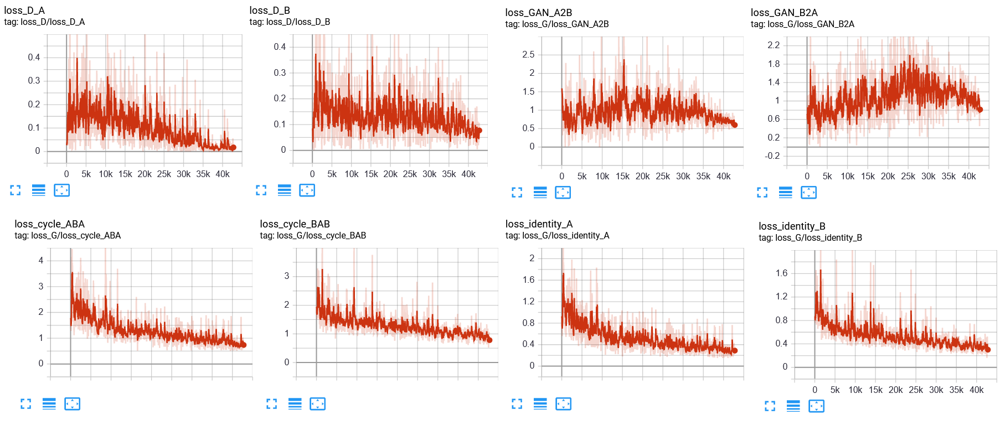

Alcuni esempi di trasformazioni visualizzati durante il training sono riportati sotto:

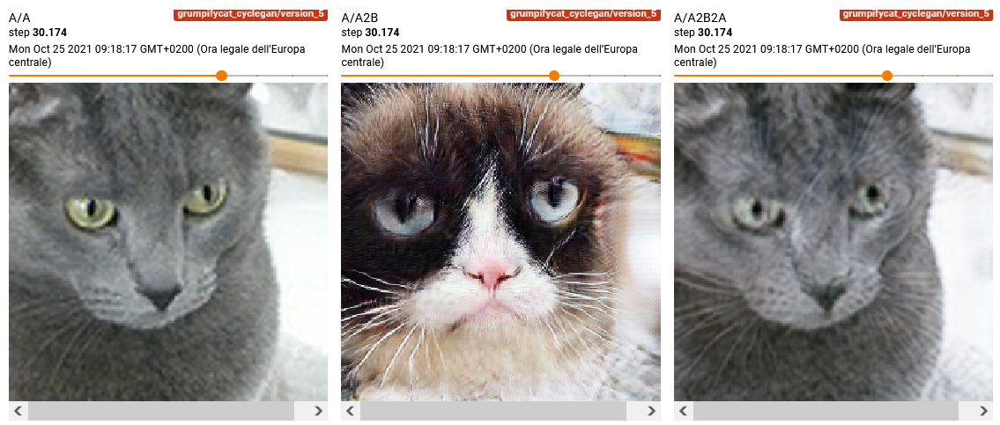

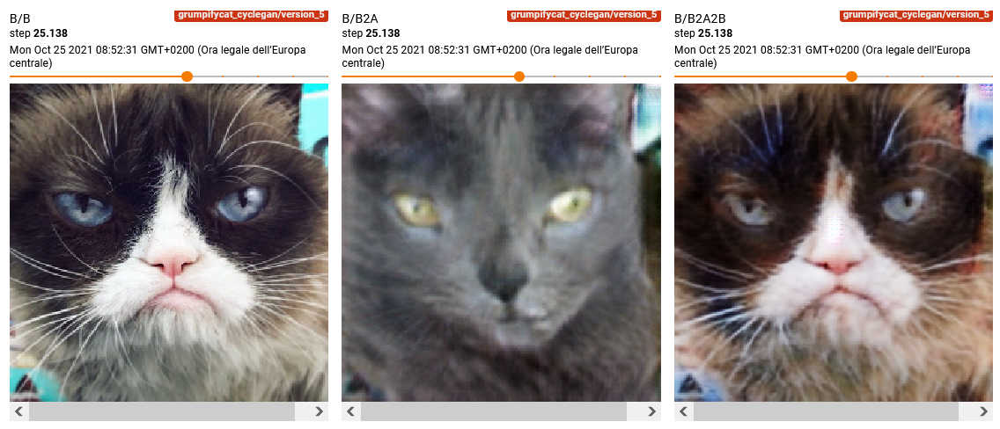

## 1.3 Risultati
Notiamo che PyTorch Lightning ha salvato in automatico l'ultimo checkpoint del modello in `tb_logs/grumpifycat_cyclegan/version_1/checkpoints/`. Questo checkpoint può essere caricato come segue:

In [33]:
mod = CycleGAN.load_from_checkpoint('tb_logs/grumpifycat_cyclegan/version_1/checkpoints/epoch=199-step=42799.ckpt')

Vediamo adesso di stampare alcuni esempi di traduzione da un dominio all'altro. Iniziamo recuperando il dataset di training:

In [34]:
dset = mod.train_dataloader().dataset

Adesso definiamo una funzione per effettuare la traduzione A2B e quella B2A per verificare che l'identità è rispettata:

In [35]:
from matplotlib import pyplot as plt
def print_example_A2B(i):
    image_in = dset[i][0]
    a2b = mod.netG_A2B(image_in.unsqueeze(0))
    a2b2a = mod.netG_B2A(a2b)

    image_in = image_in.detach().numpy().transpose(1,2,0)
    image_in-=image_in.min()
    image_in/=image_in.max()

    a2b = a2b.squeeze().detach().numpy().transpose(1,2,0)
    a2b-=a2b.min()
    a2b/=a2b.max()
    
    a2b2a = a2b2a.squeeze().detach().numpy().transpose(1,2,0)
    a2b2a-=a2b2a.min()
    a2b2a/=a2b2a.max()

    plt.figure(figsize=(12,8))
    plt.subplot(131)
    plt.imshow(image_in)
    plt.title('A')
    plt.axis('off')
    
    plt.subplot(132)
    plt.imshow(a2b)
    plt.title('A2B')
    plt.axis('off')
    
    plt.subplot(133)
    plt.imshow(a2b2a)
    plt.title('A2B2A')
    plt.axis('off')

Visualizziamo alcuni esempi di trasformazione:

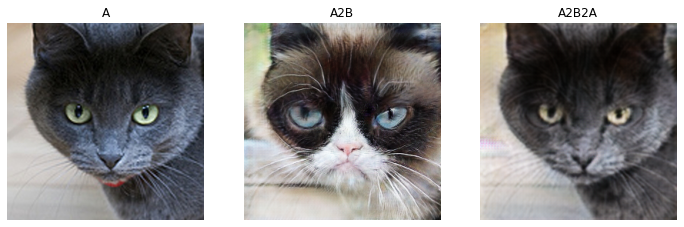

In [36]:
print_example_A2B(0)

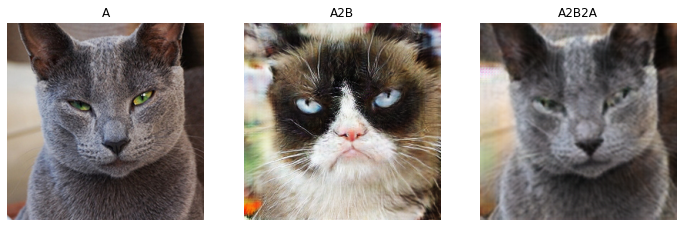

In [37]:
print_example_A2B(300)

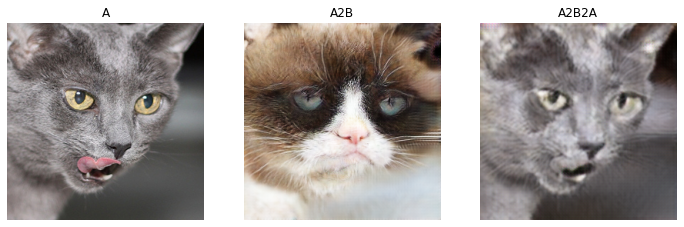

In [38]:
print_example_A2B(128)

<div>
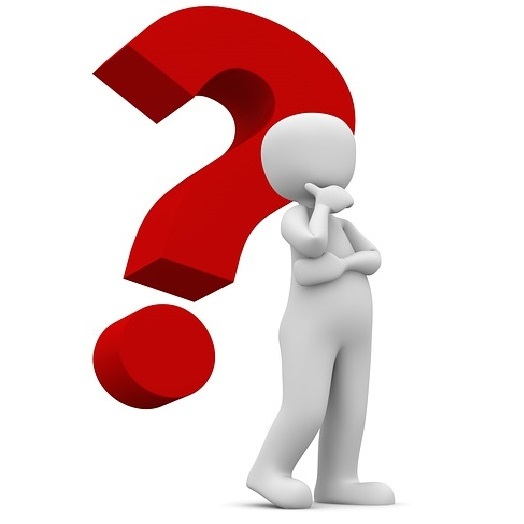
</div>

**Domanda 4**

Si analizzino degli altri esempi di trasformazione dell'immagine. Possiamo dire che il modello funziona? Ha dei limiti?

<div>
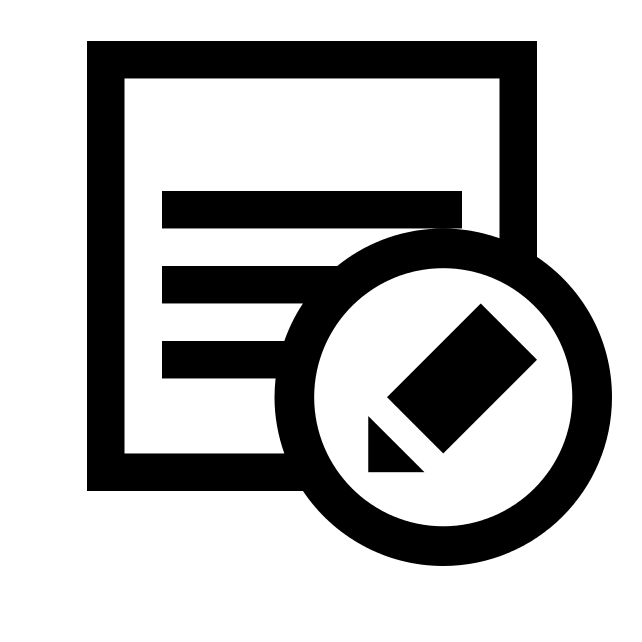
</div>

**Risposta 4**

<div style="background-color:#efefef; margin-left:150px; border:solid 1px; border-color:#dddddd; border-radius: 3px;">
<br><br><br><br><br><br>
</div>

Si noti che l'implementazione qui fornita è stata riscritta per migliorarne la leggibilità e dunque essa non è quella ufficiale. E' consigliabile usare l'implementazione ufficiale per essere sicuri di avere i risultati più in linea con la pubblicazione scientifica: https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix.

# 2 Feature-level Domain Adaptation

Vedremo adesso degli altri esempi di domain adaptation. In questo caso l'adattamento non viene fatto al livello dei pixel, ma al livello delle feature estratte dal modello. Considereremo in particolare il problema della classificazione delle immagini appartenenti a due domini: uno **sorgente** e uno **target**. Le immagini del dominio **sorgente** sono etichettate, mentre quelle del dominio **target** non sono etichettate. Entrambi i domini condividono lo stesso spazio delle etichette. L'obiettivo è quello di allenare un modello capace di fare training sulle immagini etichettate del dominio sorgente e su quelle non etichettate del dominio target e funzionare bene in fase di test sulle immagini di entrambi i domini. Questo setup è detto **unsupervised domain adaptation** in quanto le immagini del dominio target sono non etichettate e dunque l'adattamento è **non supervisionato**.

Definiamo un numero di epoche per il quale fare training:

In [39]:
NUM_EPOCHS=50

## 2.1 Dati

Considereremo due dataset di immagini di cifre comprese tra 0 e 9. Uno dei due è il classico MNIST, mentre l'altro è MNISTM, una versione di MNIST in cui le cifre sono incollate su sfondi colorati.

Utilizzeremo l'implementazione disponibile a questo link (https://github.com/eriklindernoren/PyTorch-GAN/blob/master/implementations/cogan/mnistm.py) per caricare il dataset:

In [40]:
class MNISTM(Dataset):
    """`MNIST-M Dataset."""

    url = "https://github.com/VanushVaswani/keras_mnistm/releases/download/1.0/keras_mnistm.pkl.gz"

    raw_folder = "raw"
    processed_folder = "processed"
    training_file = "mnist_m_train.pt"
    test_file = "mnist_m_test.pt"

    def __init__(self, root, mnist_root="data", train=True, transform=None, target_transform=None, download=False):
        """Init MNIST-M dataset."""
        super(MNISTM, self).__init__()
        self.root = os.path.expanduser(root)
        self.mnist_root = os.path.expanduser(mnist_root)
        self.transform = transform
        self.target_transform = target_transform
        self.train = train  # training set or test set

        if download:
            self.download()

        if not self._check_exists():
            raise RuntimeError("Dataset not found." + " You can use download=True to download it")

        if self.train:
            self.train_data, self.train_labels = torch.load(
                os.path.join(self.root, self.processed_folder, self.training_file)
            )
        else:
            self.test_data, self.test_labels = torch.load(
                os.path.join(self.root, self.processed_folder, self.test_file)
            )

    def __getitem__(self, index):
        """Get images and target for data loader.
        Args:
            index (int): Index
        Returns:
            tuple: (image, target) where target is index of the target class.
        """
        if self.train:
            img, target = self.train_data[index], self.train_labels[index]
        else:
            img, target = self.test_data[index], self.test_labels[index]

        # doing this so that it is consistent with all other datasets
        # to return a PIL Image
        img = Image.fromarray(img.squeeze().numpy(), mode="RGB")

        if self.transform is not None:
            img = self.transform(img)

        if self.target_transform is not None:
            target = self.target_transform(target)

        return img, target

    def __len__(self):
        """Return size of dataset."""
        if self.train:
            return len(self.train_data)
        else:
            return len(self.test_data)

    def _check_exists(self):
        return os.path.exists(os.path.join(self.root, self.processed_folder, self.training_file)) and os.path.exists(
            os.path.join(self.root, self.processed_folder, self.test_file)
        )

    def download(self):
        """Download the MNIST data."""
        # import essential packages
        from six.moves import urllib
        import gzip
        import pickle
        from torchvision import datasets

        # check if dataset already exists
        if self._check_exists():
            return

        # make data dirs
        try:
            os.makedirs(os.path.join(self.root, self.raw_folder))
            os.makedirs(os.path.join(self.root, self.processed_folder))
        except OSError as e:
            if e.errno == errno.EEXIST:
                pass
            else:
                raise

        # download pkl files
        print("Downloading " + self.url)
        filename = self.url.rpartition("/")[2]
        file_path = os.path.join(self.root, self.raw_folder, filename)
        if not os.path.exists(file_path.replace(".gz", "")):
            data = urllib.request.urlopen(self.url)
            with open(file_path, "wb") as f:
                f.write(data.read())
            with open(file_path.replace(".gz", ""), "wb") as out_f, gzip.GzipFile(file_path) as zip_f:
                out_f.write(zip_f.read())
            os.unlink(file_path)

        # process and save as torch files
        print("Processing...")

        # load MNIST-M images from pkl file
        with open(file_path.replace(".gz", ""), "rb") as f:
            mnist_m_data = pickle.load(f, encoding="bytes")
        mnist_m_train_data = torch.ByteTensor(mnist_m_data[b"train"])
        mnist_m_test_data = torch.ByteTensor(mnist_m_data[b"test"])

        # get MNIST labels
        mnist_train_labels = datasets.MNIST(root=self.mnist_root, train=True, download=True).train_labels
        mnist_test_labels = datasets.MNIST(root=self.mnist_root, train=False, download=True).test_labels

        # save MNIST-M dataset
        training_set = (mnist_m_train_data, mnist_train_labels)
        test_set = (mnist_m_test_data, mnist_test_labels)
        with open(os.path.join(self.root, self.processed_folder, self.training_file), "wb") as f:
            torch.save(training_set, f)
        with open(os.path.join(self.root, self.processed_folder, self.test_file), "wb") as f:
            torch.save(test_set, f)

        print("Done!")

Carichiamo il dataset:

In [41]:
mnistm_train = MNISTM(root='data', train=True, download=True)

Vediamo qualche esempio:

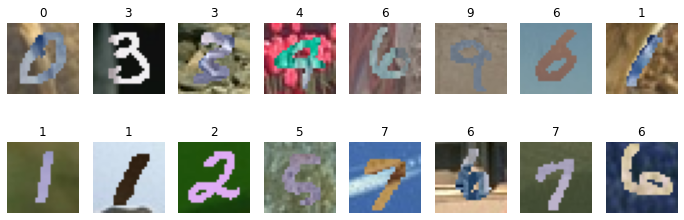

In [42]:
j=1
plt.figure(figsize=(12,4))
for i in np.random.permutation(len(mnistm_train))[:16]:
    plt.subplot(2,8,j)
    plt.imshow(np.array(mnistm_train[i][0]))
    plt.title(mnistm_train[i][1].item())
    plt.axis('off')
    j+=1
plt.show()

Confrontiamo gli esempi con il solito MNIST:

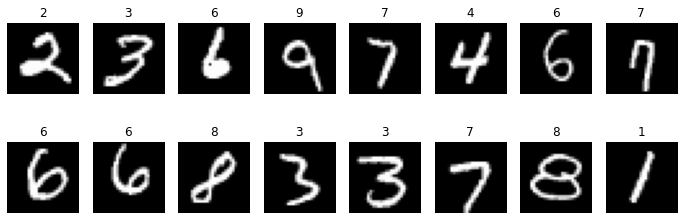

In [43]:
from torchvision.datasets import MNIST
mnist_train = MNIST(root = 'data',train=True, download=True)
j=1
plt.figure(figsize=(12,4))
for i in np.random.permutation(len(mnist_train))[:16]:
    plt.subplot(2,8,j)
    plt.imshow(np.array(mnist_train[i][0]), cmap='gray')
    plt.title(mnist_train[i][1])
    plt.axis('off')
    j+=1
plt.show()

<div>
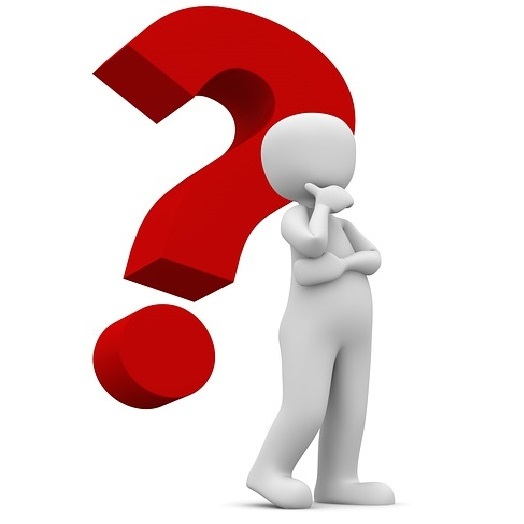
</div>

**Domanda 5**

Si confrontino gli esempi di immagini provenienti dai due dataset. Quali sono le differenze principali?

<div>
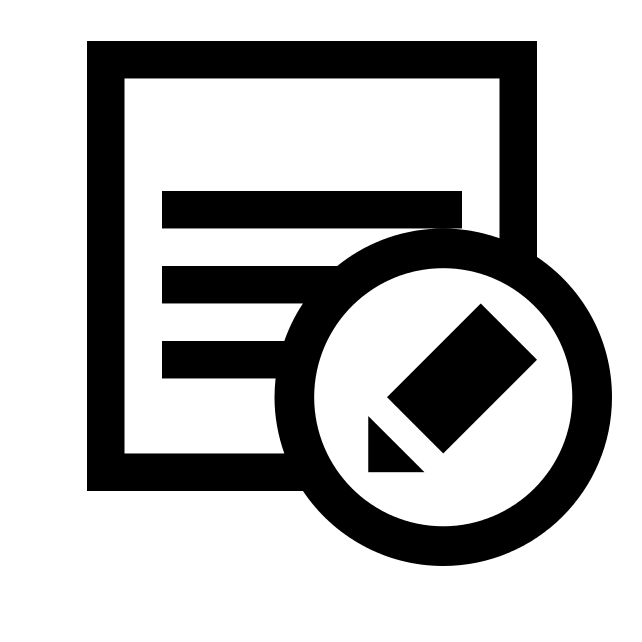
</div>

**Risposta 5**

<div style="background-color:#efefef; margin-left:150px; border:solid 1px; border-color:#dddddd; border-radius: 3px;">
<br><br><br><br><br><br>
</div>

Definiamo adesso dataset e dataloader:

In [44]:
transform = transforms.Compose([
    transforms.Lambda(lambda x: x.convert('RGB')),
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))
])

mnist_train = MNIST('data', train=True, transform=transform, download=True)
mnist_test = MNIST('data', train=False, transform=transform, download=True)

mnist_train_loader = DataLoader(mnist_train, batch_size=256, shuffle=True, num_workers=8)
mnist_test_loader = DataLoader(mnist_test, batch_size=256, num_workers=8)

mnistm_train = MNISTM('data', train=True, transform=transform, download=True)
mnistm_test = MNISTM('data', train=False, transform=transform, download=True)

mnistm_train_loader = DataLoader(mnistm_train, batch_size=256, shuffle=True, num_workers=8)
mnistm_test_loader = DataLoader(mnistm_test, batch_size=256, num_workers=8)

## 2.2 Modelli
Utilizzeremo come modello per la classificazione una semplice rete neurale basata su convoluzioni:

In [45]:
from torch import nn

class Net(nn.Module):
    def __init__(self):
        super().__init__()
        # modello feature extractor
        self.feature_extractor = nn.Sequential(
            # primo layer di convoluzioni
            nn.Conv2d(3, 10, kernel_size=5),
            nn.MaxPool2d(2),
            nn.ReLU(),
            # secondo layer di convoluzioni
            nn.Conv2d(10, 20, kernel_size=5),
            nn.MaxPool2d(2),
            nn.Dropout2d(),
        )
        
        # modulo di classificazione a partire dalle feature
        self.classifier = nn.Sequential(
            nn.Linear(320, 50),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(50, 10),
        )

    def forward(self, x):
        # estrazione delle feature
        features = self.feature_extractor(x)
        # reshape delle features
        features = features.view(x.shape[0], -1)
        # otteniamo i logits mediante il classificatore
        logits = self.classifier(features)
        return logits

Il modello definito sopra è progettato per lavorare con input di dimensione $3 \times 28 \times 28$. Vediamo le dimensioni intermedie delle feature map con la funzione `summary`:

In [46]:
mod = Net().cuda()
summary(mod, (3,28,28))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 10, 24, 24]             760
         MaxPool2d-2           [-1, 10, 12, 12]               0
              ReLU-3           [-1, 10, 12, 12]               0
            Conv2d-4             [-1, 20, 8, 8]           5,020
         MaxPool2d-5             [-1, 20, 4, 4]               0
         Dropout2d-6             [-1, 20, 4, 4]               0
            Linear-7                   [-1, 50]          16,050
              ReLU-8                   [-1, 50]               0
           Dropout-9                   [-1, 50]               0
           Linear-10                   [-1, 10]             510
Total params: 22,340
Trainable params: 22,340
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.01
Forward/backward pass size (MB): 0.08
Params size (MB): 0.09
Estimated Tot

### 2.2.1 Baseline
Inizieremo considerando un approccio baseline che consiste in allenare la rete su MNIST e fare test su MNISTM. Definiamo un oggetto di Lightning per effettuare il training. Dato che abbiamo già definito il modello, applicheremo un paradigma diverso in cui il modulo di Lightning è considerato un "task" piuttosto che un modello:

In [47]:
from torch.optim import SGD
from sklearn.metrics import accuracy_score

class ClassificationTask(pl.LightningModule):
    def __init__(self, model):
        super(ClassificationTask, self).__init__() 
        self.model = model
        self.criterion = nn.CrossEntropyLoss() 
        
    def forward(self,x):
        return self.model(x)
    
    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters())
    
    def training_step(self, train_batch, batch_idx):
        x, y = train_batch
        output = self.forward(x)
        loss = self.criterion(output,y)
        self.log('train/loss', loss)
        return loss
    
    def validation_step(self, val_batch, batch_idx):
        x, y = val_batch
        output = self.forward(x)
        
        return {
            'predictions': output.cpu().topk(1).indices,
            'labels': y.cpu()
        }
        
    def validation_epoch_end(self, outputs):
        predictions = np.concatenate([o['predictions'] for o in outputs])
        labels = np.concatenate([o['labels'] for o in outputs])
        
        acc = accuracy_score(labels, predictions)
        
        self.log('val/accuracy', acc)
        
    def test_step(self, test_batch, batch_idx):
        x, y = test_batch
        output = self.forward(x)
        
        return {
            'predictions': output.cpu().topk(1).indices,
            'labels': y.cpu()
        }
        
    def test_epoch_end(self, outputs):
        predictions = np.concatenate([o['predictions'] for o in outputs])
        labels = np.concatenate([o['labels'] for o in outputs])
        
        acc = accuracy_score(labels, predictions)
        
        self.log('test/accuracy', acc)

Adesso definiamo e alleniamo il modello su MNIST:

In [48]:
mnist_noadapt = ClassificationTask(Net())

logger = TensorBoardLogger("adaptation_logs", name="mnist_noadapt")

mnist_noadapt_trainer = pl.Trainer(max_epochs=NUM_EPOCHS, gpus=1, logger=logger)
mnist_noadapt_trainer.fit(mnist_noadapt, mnist_train_loader, mnist_test_loader)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]

  | Name      | Type             | Params
-----------------------------------------------
0 | model     | Net              | 22.3 K
1 | criterion | CrossEntropyLoss | 0     
-----------------------------------------------
22.3 K    Trainable params
0         Non-trainable params
22.3 K    Total params
0.089     Total estimated model params size (MB)


Dopo il training, le curve di performance saranno simili alle seguenti:

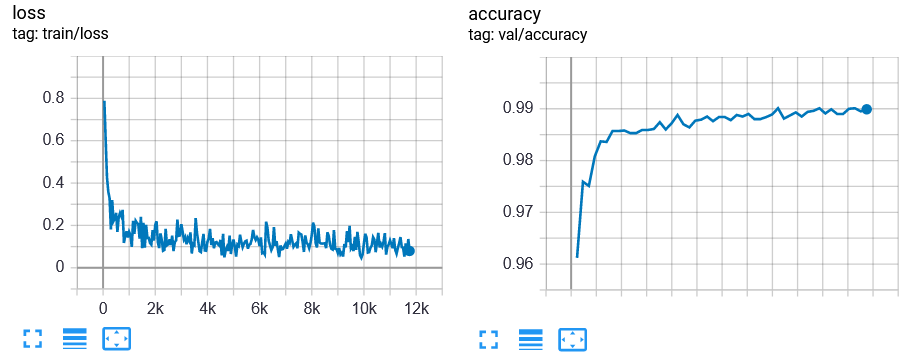

Validiamo adesso il modello sul validation set e memorizziamone il risultato:

In [50]:
mnist_noadapt_mnist_accuracy = mnist_noadapt_trainer.test(dataloaders=mnist_test_loader)[0]['test/accuracy']

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test/accuracy': 0.9898999929428101}
--------------------------------------------------------------------------------



Testiamo adesso il modello sul dominio target MNISTM:

In [51]:
mnist_noadapt_mnistm_accuracy = mnist_noadapt_trainer.test(dataloaders=mnistm_test_loader)[0]['test/accuracy']

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test/accuracy': 0.6302000284194946}
--------------------------------------------------------------------------------



### 2.2.2 Oracolo
Consideriamo adesso il modello **oracolo**, ovvero lo stesso modello allenato sui dati di MNISTM etichettati. Si noti che queste performance non sono direttamente confrontabili con quegli degli altri modelli in quanto sono relative a modelli che fanno uso delle etichette del dominio target. E' tuttavia utile considerare i risultati del modello oracolo come una sorta di **upperbound** delle performance raggiungibili mediante domain adaptation.

In [52]:
mnistm_noadapt = ClassificationTask(Net())

logger = TensorBoardLogger("adaptation_logs", name="mnistm_noadapt")

mnistm_noadapt_trainer = pl.Trainer(max_epochs=NUM_EPOCHS, gpus=1, logger=logger)
mnistm_noadapt_trainer.fit(mnistm_noadapt, mnistm_train_loader, mnistm_test_loader)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]

  | Name      | Type             | Params
-----------------------------------------------
0 | model     | Net              | 22.3 K
1 | criterion | CrossEntropyLoss | 0     
-----------------------------------------------
22.3 K    Trainable params
0         Non-trainable params
22.3 K    Total params
0.089     Total estimated model params size (MB)


Alla fine del training, le curve di performance saranno simili alle seguenti:

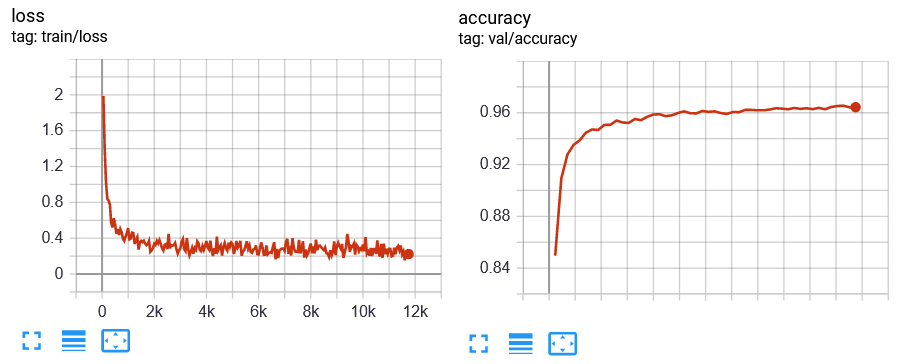

Testiamo adesso il modello sul dominio target:

In [53]:
mnistm_noadapt_mnistm_accuracy = mnistm_noadapt_trainer.test(dataloaders=mnistm_test_loader)[0]['test/accuracy']

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test/accuracy': 0.9642999768257141}
--------------------------------------------------------------------------------



Per confrontare le varie performance, possiamo iniziare a costruire una tabella:

In [54]:
import pandas as pd
results = pd.DataFrame({
    'Model':['No Adaptation', 'Oracle'],
    'MNIST':[mnist_noadapt_mnist_accuracy, '-'],
    'MNISTM': [mnist_noadapt_mnistm_accuracy, mnistm_noadapt_mnistm_accuracy]
})
results

,Model,MNIST,MNISTM
0,No Adaptation,0.9899,0.6302
1,Oracle,-,0.9643


<div>
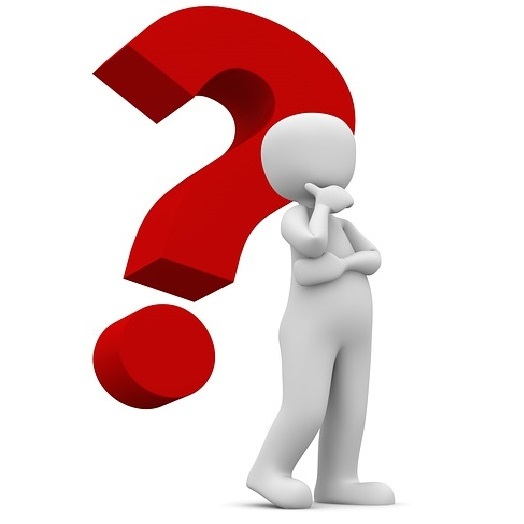
</div>

**Domanda 6**

Si confrontino le performance ottenute nei diversi setting. Quale modello funziona meglio sul target domain? Perché? Quale dei risultati coincide con un setting di domain adaptation?

<div>
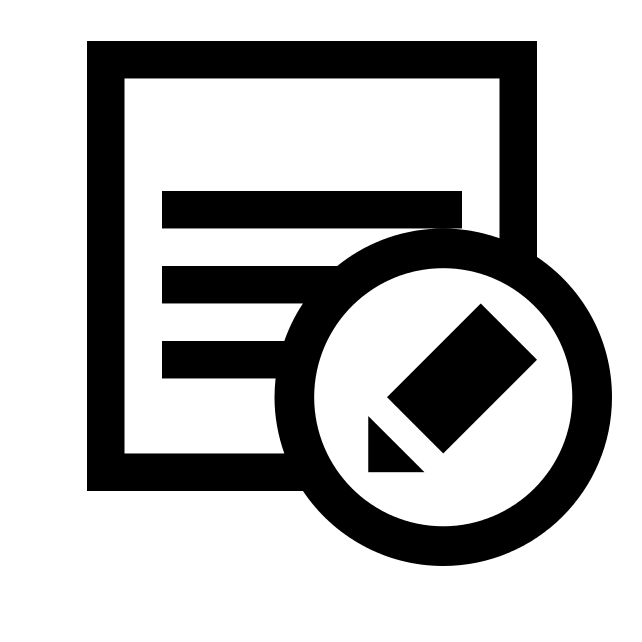
</div>

**Risposta 6**

<div style="background-color:#efefef; margin-left:150px; border:solid 1px; border-color:#dddddd; border-radius: 3px;">
<br><br><br><br><br><br>
</div>

### 2.2.3 Gradient Reversal layer

Vedremo come implementare il metodo di domain adaptation definito in questa pubblicazione scientifica: https://arxiv.org/abs/1409.7495. L'algoritmo segue lo schema mostrato nell'immagine che segue:

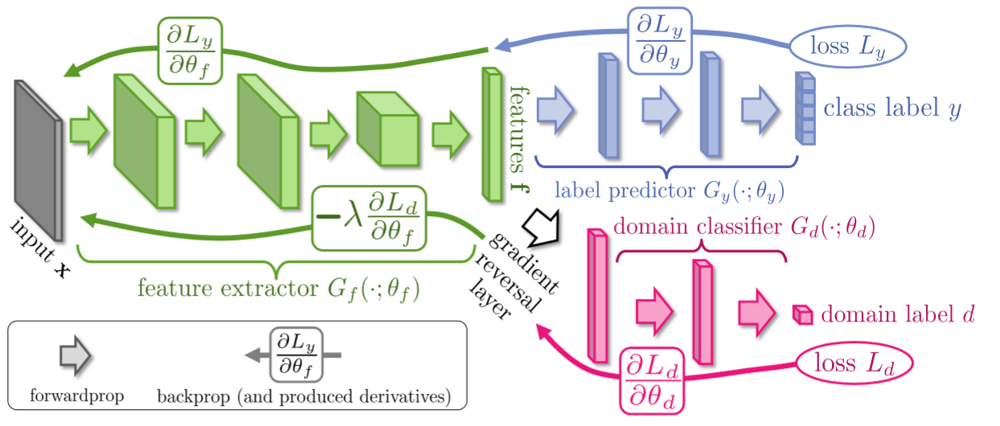

In pratica viene usato un modulo "feature extractor" (la backbone) per estrarre le feature dalle immagini di entrambi i domini. Un modulo "label predictor" viene dunque ustao per classificare le immagini del dominio A a partire dalle feature estratte. Un discriminatore viene usato per incoraggiare la backbone a estrarre feature che siano indipendenti rispetto al dominio (dunque i due domini saranno indistinguibili guardando solo le feature). A differenza delle GAN, il training non è effettuato in maniera alternata, ma viene utilizzato un **Gradient Reversal Layer (GLR)** per ottimizzare al contempo il discriminatore e il feature extractor.

In questo laboratorio, seguiremo l'implementazione fornita qui: https://github.com/jvanvugt/pytorch-domain-adaptation.

L'architetura che implementeremo si basa sul Gradinent Reversal Layer, le cui funzioni di forward e di backward sono definite come segue:

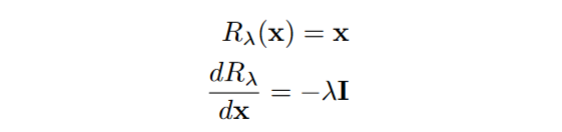

In pratica, in fase di forward, il modulo restituisce il suo input, mentre in fase di backward, viene invertito il gradiente. Seguiremo la pubblicazione originale e fare crescere il valore di $\lambda$ durante il training usando questa formula:

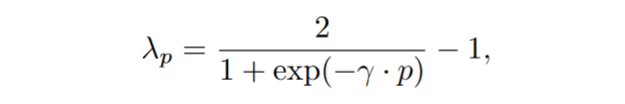

Dove $\gamma=10$ e $p \in [0,1]$ indica l'avanzamento del training (lo calcoloremo come `epoca_corrente/numero_di_epoche`.


Definiamo il modulo di gradient reversal layer:

In [55]:
from torch.autograd import Function
class RevGrad(Function):
    @staticmethod
    def forward(ctx, input_, lambda_):
        lambda_ = torch.Tensor([lambda_]).type_as(input_)
        ctx.save_for_backward(input_, lambda_)
        output = input_
        return output

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        grad_input = None
        _, lambda_ = ctx.saved_tensors
        if ctx.needs_input_grad[0]:
            grad_input = -grad_output * lambda_
        return grad_input, None


revgrad = RevGrad.apply

Implementiamo adesso il modulo per il training basato su gradient reversal layer. Iniziamo definendo il discriminatore. Questo modulo prenderà in input la mappa di feature restituita dal feature extractor e predirà il dominio di appartenenza:

In [58]:
class DiscriminatorGRL(torch.nn.Module):
    def __init__(self):
        super(DiscriminatorGRL, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(320, 50),
            nn.ReLU(),
            nn.Linear(50, 20),
            nn.ReLU(),
            nn.Linear(20, 1)
    )

    def forward(self, x, lambda_=1):
        return self.model(revgrad(x, lambda_))

Analizziamo le dimensioni intermedie delle mappe di feature del discriminatore. Useremo come dimensione dell'input un vettore di $320$ elementi, che è la dimensione dell'output del feature extractor:

In [59]:
disc = DiscriminatorGRL().cuda()
summary(disc, (320,))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                   [-1, 50]          16,050
              ReLU-2                   [-1, 50]               0
            Linear-3                   [-1, 20]           1,020
              ReLU-4                   [-1, 20]               0
            Linear-5                    [-1, 1]              21
Total params: 17,091
Trainable params: 17,091
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.07
Estimated Total Size (MB): 0.07
----------------------------------------------------------------


Durante il training, l'algoritmo dovrà prendere in input un batch di immagini appartenenti al dominio sorgente e un batch di immagini appartenenti al dominio target. Per semplificare questo tipo di caricamento, definiamo un oggetto `MultiDomainDataset` che carica coppie di immagini dei due domini:

In [60]:
class MultiDomainDataset(Dataset):
    def __init__(self, source_dataset, target_dataset):
        self.source = source_dataset
        self.target = target_dataset
        
    def __getitem__(self, index):
        im_source, lab_source = self.source[index]
        im_target, _ = self.target[random.randint(0, len(self.target)-1)]
        
        return im_source, im_target, lab_source

    def __len__(self):
        return len(self.source)

Costruiamo il dataset multidominio mnist_mnistm che usa MNIST come dominio sorgente e MNISTM come dominio target:

In [61]:
mnist_mnistm_train = MultiDomainDataset(mnist_train, mnistm_train)
mnist_mnistm_train_loader = DataLoader(mnist_mnistm_train, shuffle=True, num_workers=8, batch_size=256)

Definiamo a questo punto il modulo per il training del modello basato su Gradient Reversal Layer:

In [64]:
class DomainAdaptationGRLTask(pl.LightningModule):
    def __init__(self, model):
        super(DomainAdaptationGRLTask, self).__init__() 
        self.model = model
        self.discriminator = DiscriminatorGRL()
        
    def forward(self,x):
        return self.model(x)
    
    def configure_optimizers(self):
        return torch.optim.Adam(list(self.model.parameters()) + list(self.discriminator.parameters()))
    
    def training_step(self, train_batch, batch_idx):
        source, target, labels = train_batch
        
        source_features = self.model.feature_extractor(source).view(source.shape[0], -1)
        target_features = self.model.feature_extractor(target).view(target.shape[0], -1)
        
        label_preds = self.model.classifier(source_features)
        
        # calcoliamo il valore di lambda, che secondo la pubblicazione originale viene fatto
        # crescere da 0 a 1 nel tempo secondo questa formula
        l=2/(1+np.exp(-10*self.current_epoch/NUM_EPOCHS)) - 1
        
        domain_preds_source = self.discriminator(source_features, l)
        domain_preds_target = self.discriminator(target_features, l)
        domain_preds = torch.cat([domain_preds_source, domain_preds_target],0)
        
        source_acc = (torch.sigmoid(domain_preds_source)<0.5).float().mean()
        target_acc = (torch.sigmoid(domain_preds_target)>=0.5).float().mean()
        acc = (source_acc+target_acc)/2
        
        source_targets = torch.zeros(source.shape[0],1)
        target_targets = torch.ones(target.shape[0],1)
        domain_targets = torch.cat([source_targets, target_targets],0).type_as(source)
        
        label_loss = F.cross_entropy(label_preds, labels)
        domain_loss = F.binary_cross_entropy_with_logits(domain_preds, domain_targets)
        
        loss = domain_loss + label_loss
        
        self.log('train/domain_loss', domain_loss)
        self.log('train/label_loss', label_loss)
        self.log('train/loss', loss)
        self.log('train/disc_source_acc',source_acc)
        self.log('train/disc_target_acc',target_acc)
        self.log('train/disc_acc',acc)
        return loss
    
    def validation_step(self, val_batch, batch_idx):
        x, y = val_batch
        output = self.forward(x)
        
        return {
            'predictions': output.cpu().topk(1).indices,
            'labels': y.cpu()
        }
        
    def validation_epoch_end(self, outputs):
        predictions = np.concatenate([o['predictions'] for o in outputs])
        labels = np.concatenate([o['labels'] for o in outputs])
        
        acc = accuracy_score(labels, predictions)
        
        self.log('val/accuracy', acc)
        
    def test_step(self, test_batch, batch_idx):
        x, y = test_batch
        output = self.forward(x)
        
        return {
            'predictions': output.cpu().topk(1).indices,
            'labels': y.cpu()
        }
        
    def test_epoch_end(self, outputs):
        predictions = np.concatenate([o['predictions'] for o in outputs])
        labels = np.concatenate([o['labels'] for o in outputs])
        
        acc = accuracy_score(labels, predictions)
        
        self.log('test/accuracy', acc)

Adesso effettuiamo il training. In fase di validation e test passeremo il dataset MNISTM in modo da poter monitorare la capacità del modello di generalizzare:

In [65]:
mnist_grl = DomainAdaptationGRLTask(Net())

logger = TensorBoardLogger("adaptation_logs", name="mnist_grl")

mnist_grl_trainer = pl.Trainer(max_epochs=NUM_EPOCHS, gpus=1, logger=logger)
mnist_grl_trainer.fit(mnist_grl, mnist_mnistm_train_loader, mnistm_test_loader)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]

  | Name          | Type             | Params
---------------------------------------------------
0 | model         | Net              | 22.3 K
1 | discriminator | DiscriminatorGRL | 17.1 K
---------------------------------------------------
39.4 K    Trainable params
0         Non-trainable params
39.4 K    Total params
0.158     Total estimated model params size (MB)


Alla fine del training, i grafici di performance saranno simili ai seguenti:

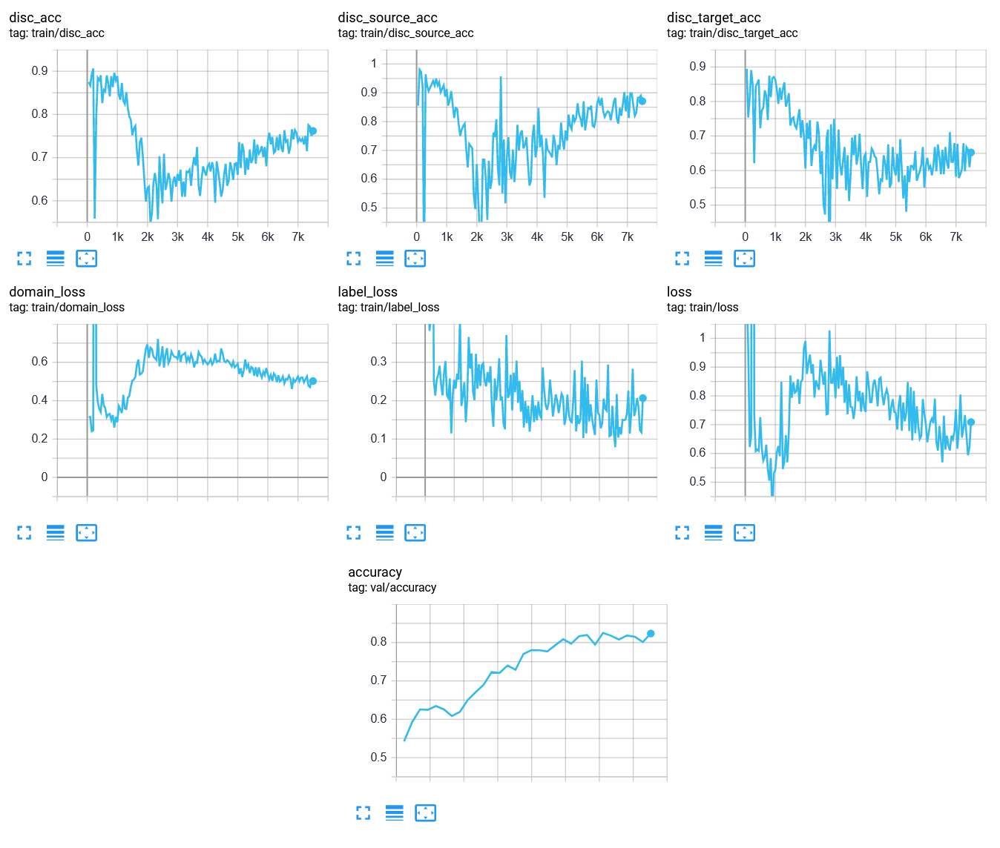

<div>
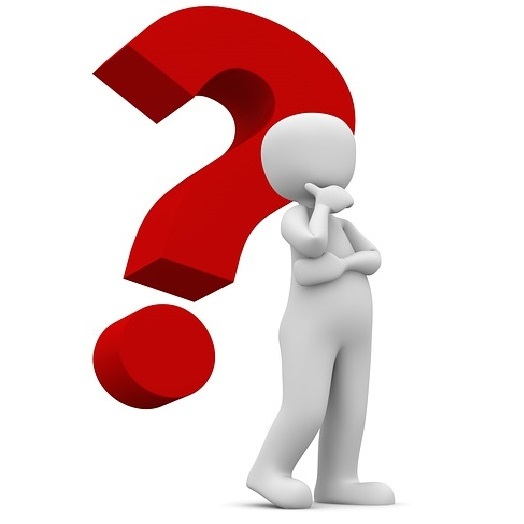
</div>

**Domanda 7**

Si commentino i grafici ottenuti. A cosa sono dovute le oscillazioni nelle loss e accuracy del discriminatore?

<div>
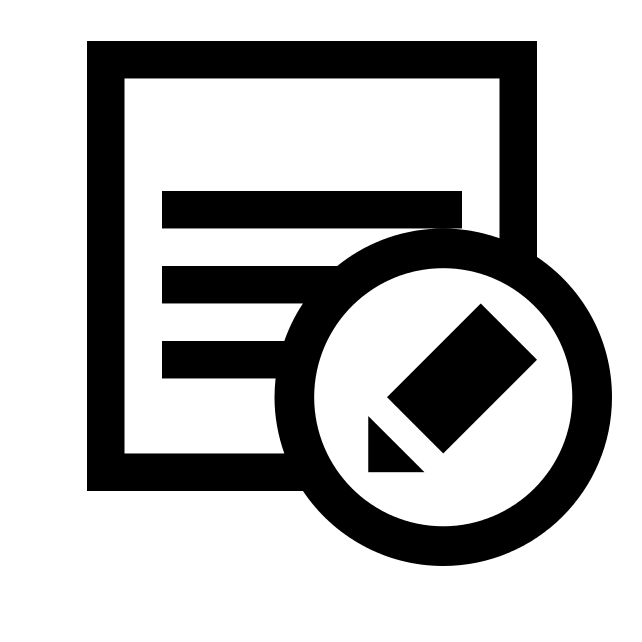
</div>

**Risposta 7**

<div style="background-color:#efefef; margin-left:150px; border:solid 1px; border-color:#dddddd; border-radius: 3px;">
<br><br><br><br><br><br>
</div>

Testiamo adesso il modello sul dominio target:

In [66]:
mnistm_grl_mnistm_accuracy = mnist_grl_trainer.test(dataloaders=mnistm_test_loader)[0]['test/accuracy']

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test/accuracy': 0.828499972820282}
--------------------------------------------------------------------------------



Testiamo anche sul dominio sorgente per completezza:

In [67]:
mnistm_grl_mnist_accuracy = mnist_grl_trainer.test(dataloaders=mnist_test_loader)[0]['test/accuracy']

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test/accuracy': 0.982200026512146}
--------------------------------------------------------------------------------



Confrontiamo le performance dei modelli visti finora:

In [68]:
results = pd.DataFrame({
    'Model':['No Adaptation', 'GRL', 'Oracle'],
    'MNIST':[mnist_noadapt_mnist_accuracy, mnistm_grl_mnist_accuracy, '-'],
    'MNISTM': [mnist_noadapt_mnistm_accuracy, mnistm_grl_mnistm_accuracy, mnistm_noadapt_mnistm_accuracy]
})
results

,Model,MNIST,MNISTM
0,No Adaptation,0.9899,0.6302
1,GRL,0.9822,0.8285
2,Oracle,-,0.9643


<div>
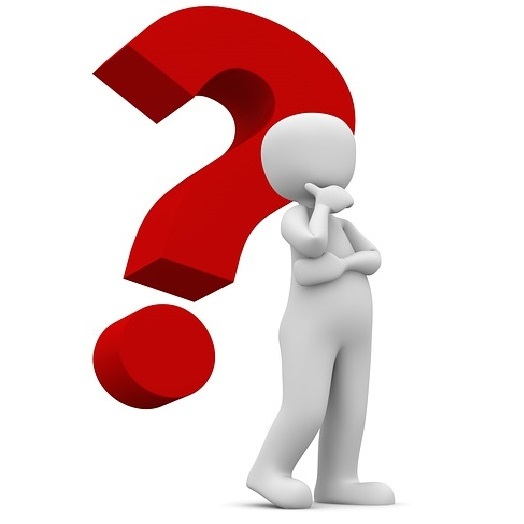
</div>

**Domanda 8**

Si discutano i risultati ottenuti. Quali sono i migliori? Quale metodo offre maggiori vantaggi?

<div>
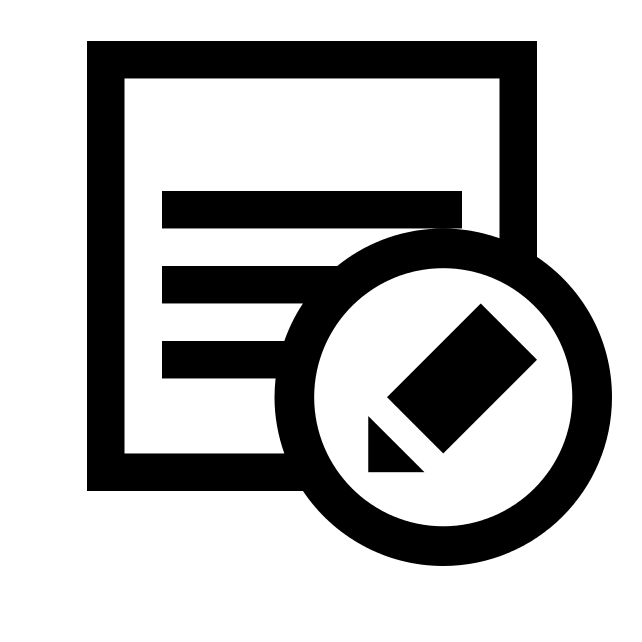
</div>

**Risposta 8**

<div style="background-color:#efefef; margin-left:150px; border:solid 1px; border-color:#dddddd; border-radius: 3px;">
<br><br><br><br><br><br>
</div>

### 2.2.4 Adversarial Domain Adaptation (ADDA)

Un altro metodo di feature-level domain adaptation di cui vedremo l'implementazione è ADDA (https://arxiv.org/pdf/1702.05464.pdf). Lo schema di funzionamento del metodo è descritto di seguito:

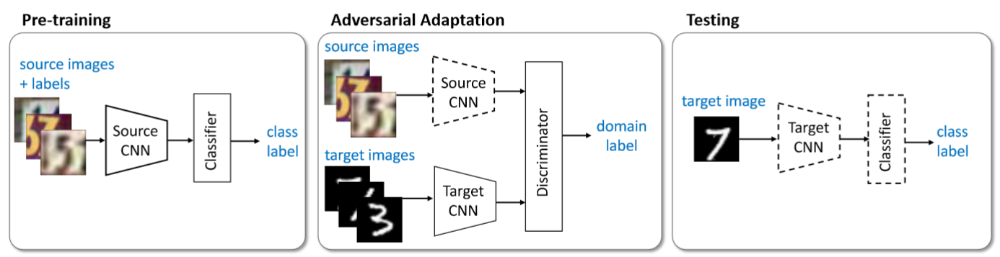

L'algoritmo funziona in tre fasi:

 * Pre-training: la rete viene allenata con le immagini ed etichette del dominio sorgente. Si tratta del modello di baseline allenato in precedenza.
 * Adversarial adaptation: in questo caso, viene utilizzato il princio delle GAN per effettuare un adattamento della rete. Più nello specifico, viene fatta una copia della rete di partenza e adattata mediante un discriminatore.
 * Testing: il modello target viene utilizzato per il test direttamente sulle immagini target.

Per gli esperimenti con questo modello utilizzeremo nuovamente la coppia di dataset MNIST-MNISTM.

La fase di pre-training è già stata effettuata in precedenza con il modello di baseline. Utilizzeremo gli stessi feature extractor e classificatore. Definiamo invece un discriminatore senza GRL:

In [82]:
class Discriminator(torch.nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(320, 50),
            nn.ReLU(),
            nn.Linear(50, 20),
            nn.ReLU(),
            nn.Linear(20, 1)
    )

    def forward(self, x):
        return self.model(x)

Vediamo dunque come implementare il modulo di Lightning che effetta l'adversarial adaptation:

In [85]:
class ADDATask(pl.LightningModule):
    def __init__(self, source_model):
        super(ADDATask, self).__init__() 
        self.source_model = source_model
        self.target_model = Net()
        self.target_model.load_state_dict(self.source_model.state_dict())
        self.target_model = self.target_model.feature_extractor
        
        self.discriminator = Discriminator()
        self.criterion = nn.BCEWithLogitsLoss()
        
    def forward(self,x):
        features = self.target_model(x).view(x.shape[0],-1)
        return self.source_model.classifier(features)
    
    def configure_optimizers(self):
        return torch.optim.Adam(self.discriminator.parameters()), torch.optim.Adam(self.target_model.parameters())
    
    def training_step(self, train_batch, batch_idx, optimizer_idx):
        source, target, labels = train_batch
        
        if optimizer_idx==0: #train discriminator
            source_features = self.source_model.feature_extractor(source).view(source.shape[0], -1)
            target_features = self.target_model(target).view(target.shape[0], -1)
            
            discriminator_x = torch.cat([source_features, target_features])
            discriminator_y = torch.cat([torch.ones(source.shape[0]).type_as(source),
                                             torch.zeros(target.shape[0]).type_as(source)])
            
            preds = self.discriminator(discriminator_x).squeeze()
            loss = self.criterion(preds, discriminator_y)
            
            self.log('train/d_loss', loss)
            
            return loss
        
        else: #train generator
            target_features = self.target_model(target).view(target.shape[0], -1)
            
            # flipped labels
            discriminator_y = torch.ones(target.shape[0]).type_as(source)
            
            preds = self.discriminator(target_features).squeeze()
            loss = self.criterion(preds, discriminator_y)
            
            self.log('train/g_loss', loss)
            
            return loss
    
    def validation_step(self, val_batch, batch_idx):
        x, y = val_batch
        output = self.forward(x)
        
        return {
            'predictions': output.cpu().topk(1).indices,
            'labels': y.cpu()
        }
        
    def validation_epoch_end(self, outputs):
        predictions = np.concatenate([o['predictions'] for o in outputs])
        labels = np.concatenate([o['labels'] for o in outputs])
        
        acc = accuracy_score(labels, predictions)
        
        self.log('val/accuracy', acc)
        
    def test_step(self, test_batch, batch_idx):
        x, y = test_batch
        output = self.forward(x)
        
        return {
            'predictions': output.cpu().topk(1).indices,
            'labels': y.cpu()
        }
        
    def test_epoch_end(self, outputs):
        predictions = np.concatenate([o['predictions'] for o in outputs])
        labels = np.concatenate([o['labels'] for o in outputs])
        
        acc = accuracy_score(labels, predictions)
        
        self.log('test/accuracy', acc)

Procediamo ora con il training:

In [86]:
mnist_adda = ADDATask(mnist_noadapt.model)

logger = TensorBoardLogger("adaptation_logs", name="mnist_adda")

mnist_adda_trainer = pl.Trainer(max_epochs=NUM_EPOCHS, gpus=1, logger=logger)
mnist_adda_trainer.fit(mnist_adda, mnist_mnistm_train_loader, mnistm_test_loader)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]

  | Name          | Type              | Params
----------------------------------------------------
0 | source_model  | Net               | 22.3 K
1 | target_model  | Sequential        | 5.8 K 
2 | discriminator | Discriminator     | 17.1 K
3 | criterion     | BCEWithLogitsLoss | 0     
----------------------------------------------------
45.2 K    Trainable params
0         Non-trainable params
45.2 K    Total params
0.181     Total estimated model params size (MB)


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f434e28e048>
Traceback (most recent call last):
  File "/home/furnari/miniconda3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home/furnari/miniconda3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
Exception ignored in:     w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)<function _MultiProcessingDataLoaderIter.__del__ at 0x7f434e28e048>

  File "/home/furnari/miniconda3/lib/python3.7/multiprocessing/process.py", line 138, in join
Traceback (most recent call last):
      File "/home/furnari/miniconda3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
assert self._parent_pid == os.getpid(), 'can only join a child process'
    AssertionErrorself._shutdown_workers(): can only join a child process

  File "/home/furnari/miniconda3/lib/python3.7/site-packages/torch

: AssertionErrorcan only join a child process:     
can only join a child processw.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)

  File "/home/furnari/miniconda3/lib/python3.7/multiprocessing/process.py", line 138, in join
    Exception ignored in: Exception ignored in: assert self._parent_pid == os.getpid(), 'can only join a child process'<function _MultiProcessingDataLoaderIter.__del__ at 0x7f434e28e048>
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f434e28e048>
AssertionError
: Traceback (most recent call last):
can only join a child process
Traceback (most recent call last):
  File "/home/furnari/miniconda3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
  File "/home/furnari/miniconda3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
        self._shutdown_workers()self._shutdown_workers()

  File "/home/furnari/miniconda3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutd

Le curve di performance dopo il training saranno simili alle seguenti:

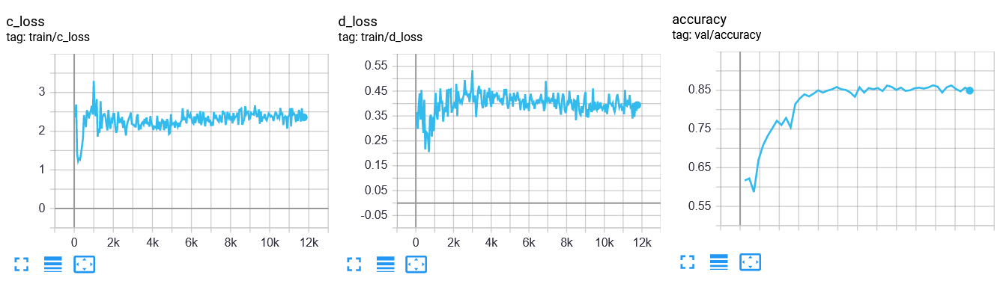

<div>
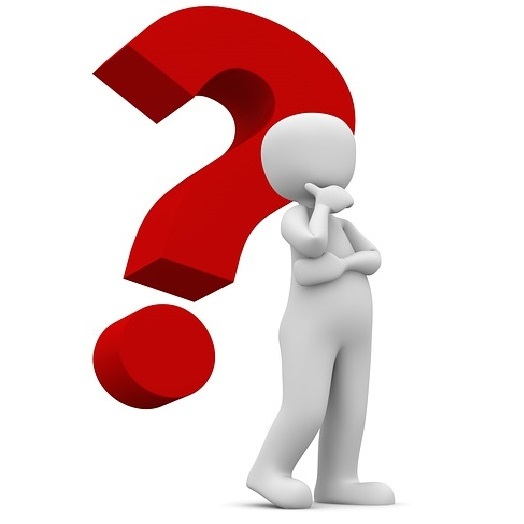
</div>

**Domanda 9**

Si confrontino le curve ottenute da questo modello con quelle ottenute dal modello GRL. Ci sono differenze? Quale modello è più efficiente?

<div>
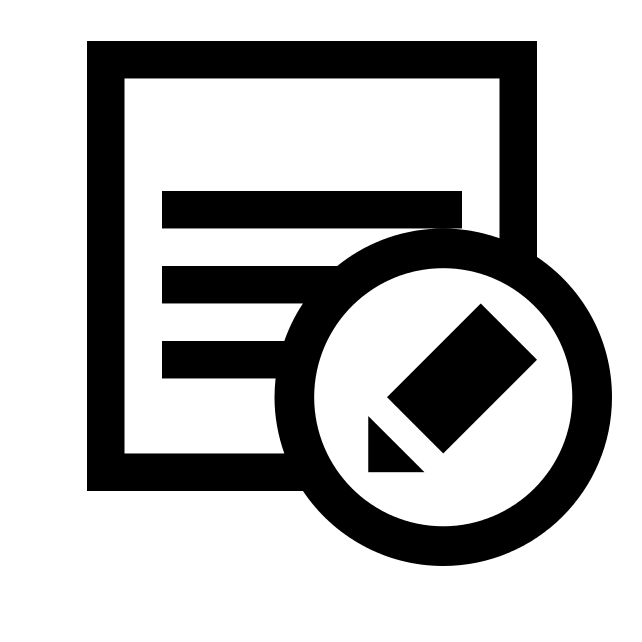
</div>

**Risposta 9**

<div style="background-color:#efefef; margin-left:150px; border:solid 1px; border-color:#dddddd; border-radius: 3px;">
<br><br><br><br><br><br>
</div>

Testiamo adesso il modello sul dominio target e sul dominio sorgente:

In [87]:
mnistm_adda_mnistm_accuracy = mnist_adda_trainer.test(dataloaders=mnistm_test_loader)[0]['test/accuracy']
mnistm_adda_mnist_accuracy = mnist_adda_trainer.test(dataloaders=mnist_test_loader)[0]['test/accuracy']

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test/accuracy': 0.8490999937057495}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test/accuracy': 0.9212999939918518}
--------------------------------------------------------------------------------



Confrontiamo le performance dei modelli allenati finora:

In [88]:
results = pd.DataFrame({
    'Model':['No Adaptation', 'GRL', 'ADDA', 'Oracle'],
    'MNIST':[mnist_noadapt_mnist_accuracy, mnistm_grl_mnist_accuracy, mnistm_adda_mnist_accuracy, '-'],
    'MNISTM': [mnist_noadapt_mnistm_accuracy, mnistm_grl_mnistm_accuracy, mnistm_adda_mnistm_accuracy, mnistm_noadapt_mnistm_accuracy]
})
results

,Model,MNIST,MNISTM
0,No Adaptation,0.9899,0.6302
1,GRL,0.9822,0.8285
2,ADDA,0.9213,0.8491
3,Oracle,-,0.9643


<div>
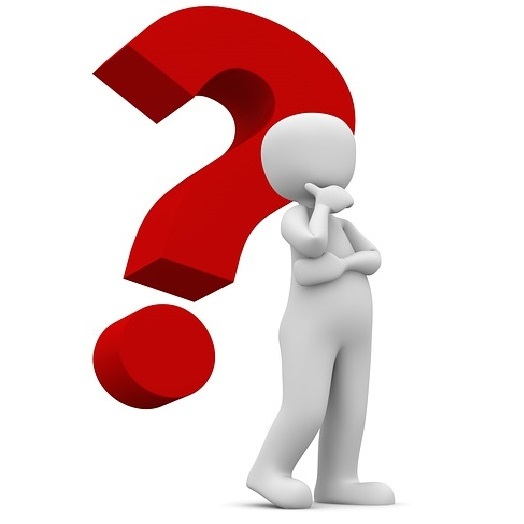
</div>

**Domanda 10**

Si confrontino e discutano i risultati ottenuti dai vari modelli testati. Quale permette di ottenere le performance migliori?

<div>
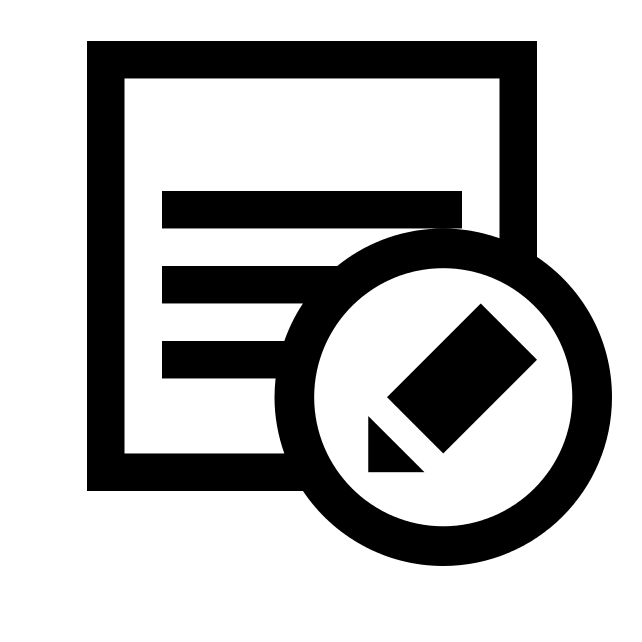
</div>

**Risposta 10**

<div style="background-color:#efefef; margin-left:150px; border:solid 1px; border-color:#dddddd; border-radius: 3px;">
<br><br><br><br><br><br>
</div>

# Esercizi

<div>
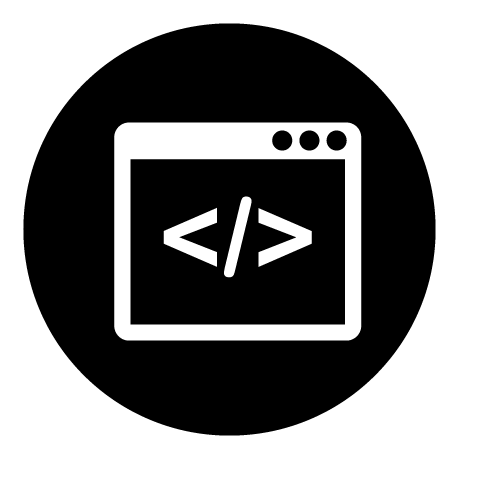
</div>

**Esercizio 1**

Gli autori di CycleGAN mettono a disposizione diversi dataset sui quali sperimentare al seguente link: https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/. Si copi e adatti l'implementazione di CycleGAN qui definita per creare un programma contenuto in un file `cyclegan.py`. Il programma deve prendere in input come argomenti i parametri dell'oggetto CycleGAN, più il nome dell'esperimento di Tensorboard per il salvataggio dei log. Si usi il programma appena creato per allenare CycleGAN su uno degli altri dataset proposti al link indicato.

<div>
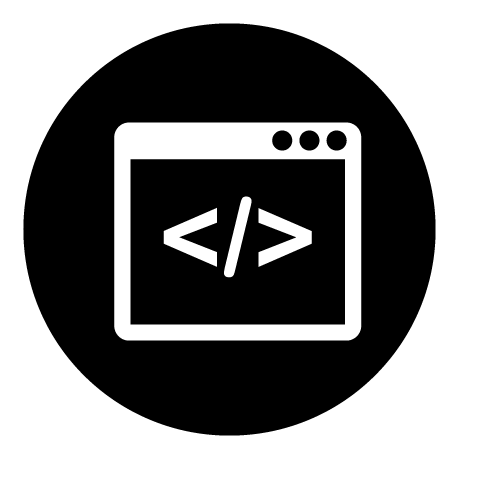
</div>

**Esercizio 2**

Si ripeta il training effettuato nell'esercizio precedente utilizzando l'implementazione ufficiale di CycleGAN (https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix). Si confrontino i risultati ottenuti con le due implementazioni.

<div>
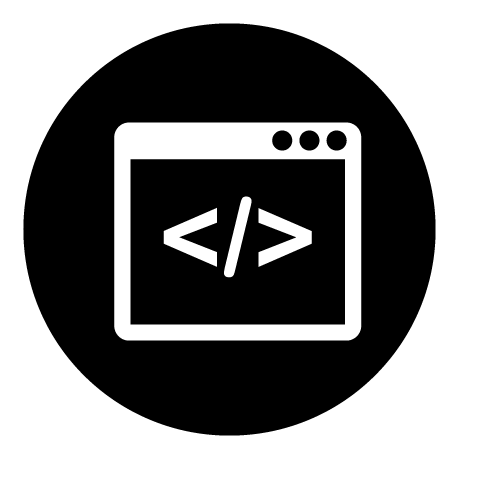
</div>

**Esercizio 3**

CycleGAN può essere utilizzata per fare unsupervised domain adaptation. Si alleni CycleGAN per trasformare le immagini dal domino MNIST a MNISTM. Si eseguano dunque i seguenti esperimenti:

 * Allenare un classificatore su MNIST e testarlo su MNISTM;
 * Allenare un classificatore su MNIST e testarlo sulle immagini di MNISTM trasformate in dominio MNIST;
 * Allenare un classificatore sulle immagini MNIST trasformate in dominio MNISTM e testarlo su immagini MNISTM.
 
Si confrontino i tre metodi e si discutano loro pro e contro.

<div>
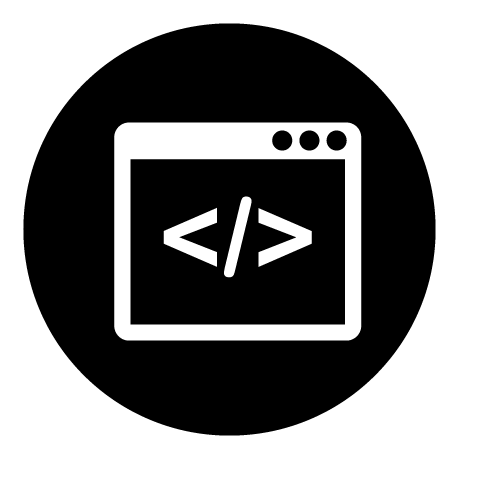
</div>

**Esercizio 4**

Si usi il codice presentato in questo laboratorio per scrivere un programma `train_grl.py` che permetta di fare training del modello basato su GRL. Si modifichi il programma per effettuare l'adattamento dal dataset `SVHN` contenuto in torchvision e il dataset `MNIST`.

<div>
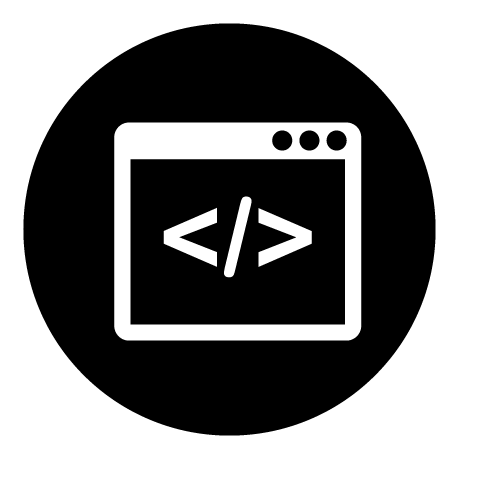
</div>

**Esercizio 5**

Si usi il codice presentato in questo laboratorio per scrivere un programma `train_adda.py` che permetta di fare training del modello ADDA. Si modifichi il programma per effettuare l'adattamento dal dataset `SVHN` contenuto in torchvision e il dataset `MNIST`.

<div>
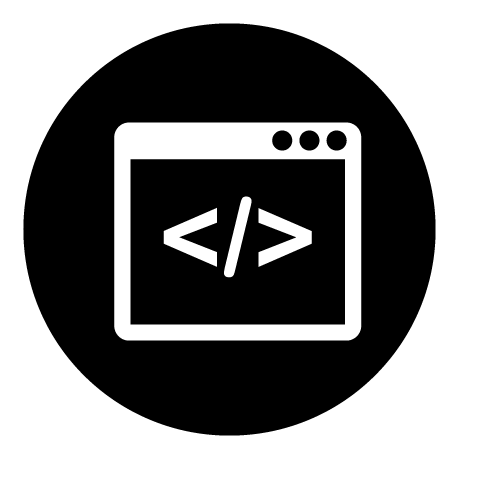
</div>

**Esercizio 6**

Si costruisca una architettura che mette insieme tutte le tecniche di domain adaptation viste in questo laboratorio considerando i dataset MNIST e MNISTM. In particolare:

 * Effettuare pixel-level domain adaptation con CycleGAN;
 * Allenare l'architettura GRL su immagini MNISTM trasformate in dominio MNIST come dataset sorgente e immagini MNIST non etichettate come dataset target;
 * Adattare il modello allenato con ADDA.
 
Misurare le performance del modello nei vari stadi di training e commentare i risultati ottenuti.

# References

 * Documentazione di PyTorch. http://pytorch.org/docs/stable/index.html
 * Documentazione di PyTorch Lightning. https://www.pytorchlightning.ai/
 * Esempi di domain adaptation con PyTorch. https://github.com/jvanvugt/pytorch-domain-adaptation